<h1 align='center'>Milestone 1: Proposal</h1>
<h3 align='center'>Group 5：</h3>
<h4 align='center'>Abby Ross | Joseph Distler | Nathan Dierkes | Viraj Vilas Rane | Xinyue Chen | Yinkai Xiong</h4>

<h2 align="center">Introduction</h2>

<h3>Business Problem: </h3>

Airbnb is a company that provides a platform users classified as homeowners to rent out rooms, or the entire house, to any of the Airbnb users classified as renters.  This is primarily done in high tourism locations, but is also fairly prevelant in most of the large US cities.  Airbnb would like to increase its user base by identifying potential hosts to convince them to use their property as a rental location. Airbnb receives a percentage of the profit that the rentals on their platform create; therefore it is in their best interest to grow the number of rental properties for their potential customers. The company has already gathered a large amount of data on its current listings and has come to our group to analyze said data. They would like to provide the hosts with suggestions for their property descriptions, which amenities to offer, etc., and use these values to predict the ratings, listing prices, booking percentage of available dates, and more. To pilot this idea, the company would like to focus on one city in the United States before rolling this predictive model out to other locations. The dataset to be used in this analysis will be from Inside Airbnb, specifically the Chicago, Illinois datasets. The company would like to use this analysis to determine the ideal property type, location, and amenities to look for potential rental locations, and then predict how the host’s actions (descriptions, response rate, etc.) would affect the listing’s potential.

<h3>Scenarios: </h3>

<h4>Price prediction</h4>

The hosts want to lease their properties on Airbnb, but they are not sure what prices they should put for their new properties (of differing types). They want to build and use a statistical model to predict the Airbnb rental trend next year. As the economy grows every year, Airbnb is looking for a new price range for their new properties. The hosts can use this price reference to determine whether they should list their properties on Airbnb. Airbnb can use this model to make their marketing plan to recruit their target partners (hosts). 

<h4>Customer satisfaction prediction</h4>

Customers are looking for properties to rent that fit their budget of expenditure in comparison with the amenities offered at the rental locations. Therefore, customers are looking for reliable feedback and rating system that aligns with what they are willing to pay to stay there. Airbnb would use this model to offer the customers the right properties, within their price range, to increase the chance of them using their platform. This model will be based on the feedback that the customer provides after visiting a particular property, and then will use this data to improve its recommendation system for future customers who look at the property. 

<h4>Recommendation system</h4>

As the customers are clicking on the property that they are interested in, Airbnb also offers the customers similar properties they might like. This allows the customers to explore more options related to their search criteria and increases the chances for the customer to go for the options suggested by Airbnb.


<h3>The result should help Airbnb to answer multiple questions regarding their future operations, including:</h3>
<h4>What will the price for a new property be next year (rise or fall)? (price prediction)</h4>
Observations that could help us to predict property price next year:

- Room types
- Amenities
- Zipcodes
- Latitude and longitude
- Distance from the center of the city


<h4>What rating score customers would give to a new property? (customer satisfaction prediction)</h4>
Observations that could help us to predict the satisfaction of customers for new properties:

- Keywords in “comments”
- Historical comments rating
- Host response time and/or rate
- Host’s “about me” field
- Property description keywords
- Neighborhood overview entered by the host
- Amenities

<h4>What types of housings should the company recommend to customers after they click on one specific housing? (Recommendation system)</h4>
Observations that could help us to recommend housing to Guests:

- Room type
- Location
- Amenities


<h2 align="center">Data Source and Collection</h2>

<h3>Data Source</h3>

The main data is sourced from the Inside Airbnb website at: http://insideairbnb.com/get-the-data.html.  This data was collected by Airbnb and posted online for use by anyone.

City of Chicago latitude and longitude sourced from: https://www.latlong.net/place/chicago-il-usa-1855.html

<h3>Key Information</h3>

Key information in the dataset includes, but is not limited to:

- Listing ID, name, description, and neighborhood overview, location (including longitude and latitude), various descriptors (property type, beds, bathrooms, amenities, price, etc.)

- Host ID, name, location, “about” description, response rate and time, acceptance rate, number of listings, if they have a profile picture uploaded, if their identity has been verified

- Review information including ratings on listing accuracy, cleanliness, location, etc.


<h2 align="center">Data Manipulation</h2>

In order to start the data analysis, we will need to import a variety of packages.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import math
import statsmodels.api as sm
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from wordcloud import WordCloud, STOPWORDS
import folium
from folium import plugins
from folium.plugins import HeatMap
import json
from glob import glob

# kindly make sure to install folium and wordcloud packages before executing the code.

We will read in the data, which was downloaded from the Airbnb website (InsideAirbnb) and look at its info.

In [2]:
# Read in data
dat = pd.read_csv('listings.csv')
dat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6366 entries, 0 to 6365
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            6366 non-null   int64  
 1   listing_url                                   6366 non-null   object 
 2   scrape_id                                     6366 non-null   float64
 3   last_scraped                                  6366 non-null   object 
 4   name                                          6366 non-null   object 
 5   description                                   6352 non-null   object 
 6   neighborhood_overview                         4663 non-null   object 
 7   picture_url                                   6366 non-null   object 
 8   host_id                                       6366 non-null   int64  
 9   host_url                                      6366 non-null   o

We can see that there are 74 columns, and 6,366 observations, however some values are missing in various columns.

<h3>Data Cleansing</h3>

<h4>Drop off irrelevant columns:</h4>

* URLs will not be useful for analysis
* Empty columns will not be useful: **'neighborhood_group_cleansed', 'bathrooms', 'calendar_updated'**
* The **'neighborhood'** column only has blank values or "Chicago, Illinois, United States" value, making it useless
* **'host_listings_count'** and **'host_total_listings_count'** are essentially duplicate information, we will use the **'calculated_host_listings_xxx'** columns instead
* **'scrape_id'** is all the same value and not useful for our needs
* **'calendar_last_scraped'** can be dropped as well since it is the same value as **'last_scraped'**

In [3]:
# Drop url columns
dat = dat.drop(['listing_url','host_url','host_thumbnail_url','host_picture_url','picture_url'], axis = 1)

# Drop empty columns
dat = dat.drop(['neighbourhood_group_cleansed','bathrooms','calendar_updated'], axis = 1)

# Drop rest
dat = dat.drop(['neighbourhood','host_listings_count','host_total_listings_count','scrape_id','calendar_last_scraped'], axis = 1)

Let us check for duplicate values and columns.

In [4]:
print ("Dataframe shape prior to removing duplicates: " + str(dat.shape))
dat = dat.drop_duplicates()
dat = dat.loc[:,~dat.columns.duplicated()]
print ("Dataframe shape after removing duplicates: " + str(dat.shape))

Dataframe shape prior to removing duplicates: (6366, 61)
Dataframe shape after removing duplicates: (6366, 61)


We can see that the dataframe did not include any duplicate observations.

<h4>Bathrooms Column:</h4>

In [5]:
dat['bathrooms_text'].sample(10)

3140            1 bath
4142    1 private bath
5741         1.5 baths
4330            1 bath
416            2 baths
3347            1 bath
5835            1 bath
1328            1 bath
3839            1 bath
5805            1 bath
Name: bathrooms_text, dtype: object

Looking at the 'bathrooms_text' column, we see that it is not very usable in its current state.  We will split the bathroom text column into two: one containing a float variable for the number of bathrooms, and the other an additional descriptor of the bathroom (shared/private).

In [6]:
# First let us make all text lowercase to simplify string manipulation
dat['bathrooms_text'] = dat['bathrooms_text'].str.lower()

# Next we must convert any text 'half' to 0.5 so it is included in the subsequent number extraction
dat['bathrooms_text'] = dat['bathrooms_text'].str.replace(r'(half)+','0.5', regex = True)

# Then extract the numbers into the new 'bathrooms' float32 data type column
dat['bathrooms'] = dat['bathrooms_text'].str.extract(r'(\d+\.?\d*)', expand = True).astype('float')

# This leaves us with only float and NaN values
dat['bathrooms'].unique()

array([ 1. ,  2. ,  1.5,  3. ,  2.5,  0. ,  3.5, 11. ,  5. ,  nan,  0.5,
        4. ,  4.5, 11.5,  6.5,  7. ,  5.5,  6. ,  8. , 12.5, 10. ])

Above are the unique values left for the float variable in the column 'bathrooms'. The test portion requires a little more refining:

In [7]:
# Remove the text 'bath', unnecessary symbols and whitespace, then extract the leftover text

dat['bathrooms_text'] = dat['bathrooms_text'].str.replace(r'(bath)s*|(Bath)s*','', regex = True)
dat['bathrooms_text'] = dat['bathrooms_text'].str.replace(r' +|\.+|\-+','', regex = True)
dat['bathrooms_text'] = dat['bathrooms_text'].str.extract(r'(\D+)')
dat['bathrooms_text'].count()

1587

In [8]:
dat['bathrooms_text'].unique()

array(['shared', nan, 'private'], dtype=object)

This leaves us with only 1,587 observations that contain one of the bathroom descriptors, 'shared' or 'private'; the rest are missing values since the original data did not contain text for them.

<h4>DateTime Columns:</h4>

Next, let's convert the datetime columns into the proper datatype.

In [9]:
# Convert dates to datetime data type

for x in ['last_scraped', 'host_since', 'first_review', 'last_review']:
    dat[x] = pd.to_datetime(dat[x])

In order to see the length of time that a host has been active on the platform, we will create a new column called 'host_age' which we can visualize later.  Note: this will also be converted to a float variable instead of a timedelta variable.

In [10]:
dat['host_age'] = (dat['last_scraped'] - dat['host_since'])/pd.to_timedelta(1, unit='D')

In [11]:
dat['host_age'].sample(5)

3308    3103.0
1603    2391.0
4443    1667.0
3251    2340.0
2961    1496.0
Name: host_age, dtype: float64

<h4>'Rate' Columns:</h4>

In [12]:
dat['host_response_rate'].sample(5)

6155     90%
2958    100%
5056     95%
4674     99%
3341     96%
Name: host_response_rate, dtype: object

We can see that we will need to convert the percentage columns ('host_response_rate' and 'host_acceptance_rate') into float variables.

In [13]:
# Strip the percentage sign and convert host response rate and acceptance rate columns into float

dat['host_response_rate'] = dat['host_response_rate'].str.replace(r'(\D)','', regex = True).astype('float')/100
dat['host_acceptance_rate'] = dat['host_acceptance_rate'].str.replace(r'(\D)','', regex = True).astype('float')/100
dat['host_response_rate'].sample(5)

5550    0.97
5508    1.00
4583    1.00
5837    1.00
1598    1.00
Name: host_response_rate, dtype: float64

<h4>Boolean Columns:</h4>

In [14]:
dat['host_is_superhost'].unique()

array(['t', 'f', nan], dtype=object)

We will convert the 't' and 'f' values to binary float values in all of the boolean columns for later analysis, where 1 will mean "True".

In [15]:
# Map all boolean columns to float 1/0 values

dat['host_is_superhost'] = dat['host_is_superhost'].map({'t':1,'f':0}).astype('float')
dat['host_has_profile_pic'] = dat['host_has_profile_pic'].map({'t':1,'f':0}).astype('float')
dat['host_identity_verified'] = dat['host_identity_verified'].map({'t':1,'f':0}).astype('float')
dat['has_availability'] = dat['has_availability'].map({'t':1,'f':0}).astype('float')
dat['instant_bookable'] = dat['instant_bookable'].map({'t':1,'f':0}).astype('float')

In [16]:
dat['host_is_superhost'].unique()

array([ 1.,  0., nan])

<h4>Price Column:</h4>

Convert the price column to a float data type.

In [17]:
# Extract only the decimal digits and the period

dat['price'] = dat['price'].str.extract(r'(\d+\.\d+)').astype('float')

In [18]:
dat['price'].sample(5)

2013    105.0
3394    100.0
592      55.0
777     308.0
5963    112.0
Name: price, dtype: float64

<h4>License Column:</h4>

Since we will not be able to use the individual license numbers, we will convert this column into a categorical variable, where 1 means the listing has a license, and 0 does not.  For our purposes, we will consider a license that is still pending as not having a license (i.e. 0).

In [19]:
dat['license'].sample(10)

2693                 R18000031847
4414                 R21000062044
52                   R21000061018
2228    City registration pending
790     City registration pending
3688                 R19000046151
2263                 R18000027982
4651    City registration pending
3202             32+ Days Listing
4503    City Registration Pending
Name: license, dtype: object

In [20]:
dat['license'] = dat['license'].fillna(0)
dat.loc[dat['license'].str.contains('pending', na=False), 'license'] = 0
dat.loc[dat['license'] != 0, 'license'] = 1
dat['license'] = dat['license'].astype('float')

In [21]:
dat['license'].sample(10)

2519    1.0
5072    1.0
6108    1.0
1082    1.0
5289    1.0
635     1.0
824     1.0
3815    1.0
1117    1.0
3450    1.0
Name: license, dtype: float64

<h4>Ratings</h4>

Let us create an average rating column that includes the average of all review scores values.

In [22]:
dat['avg_rating'] = dat[['review_scores_rating','review_scores_accuracy','review_scores_cleanliness',
                         'review_scores_checkin','review_scores_communication','review_scores_location',
                        'review_scores_value']].mean(axis = 1)
dat['avg_rating'].describe()

count    5282.000000
mean        4.748542
std         0.514896
min         0.000000
25%         4.737143
50%         4.861429
75%         4.938571
max         5.000000
Name: avg_rating, dtype: float64

<h4>Missing Values</h4>

For the column **'host_response_time'**, convert to binary value and create a new column represent if a host respose is within a day.

In [23]:
#Categorical within an hour,within a few hours, within a day to 1(true), NaN,a few days or more to 0(false) 
dat['host_response_inADay'] = dat.host_response_time.map({'within an hour': 1, 
                                                        'within a few hours': 1, 
                                                        'within a day':1, 
                                                        'a few days or more':0, 
                                                        np.nan:0})

For columns: **description**, **neighborhood_overview**, **host_location**, **host_about**, **host_neighbourhood**
     using 'Unknown' to fill the missing value, because these columns does not have direct effect on project topic.

In [24]:
dat['description'].fillna(value='Unknown', inplace=True)
dat['neighborhood_overview'].fillna(value='Unknown', inplace=True)
dat['host_location'].fillna(value='Unknown', inplace=True)
dat['host_about'].fillna(value='Unknown', inplace=True)
dat['host_neighbourhood'].fillna(value='Unknown', inplace=True)

For columns: **host_name**, **host_since**, **host_has_profile_pic**, **host_identity_verified**, it is easy to see below these rows contains many NaN value, so drop directly.

In [25]:
dat = dat.dropna(subset=['host_name'])

In [26]:
nullseries = dat.isnull().sum()
print(nullseries[nullseries > 0])

host_response_time             1178
host_response_rate             1178
host_acceptance_rate            984
bathrooms_text                 4779
bedrooms                        536
beds                             81
first_review                   1083
last_review                    1083
review_scores_rating           1083
review_scores_accuracy         1119
review_scores_cleanliness      1119
review_scores_checkin          1120
review_scores_communication    1121
review_scores_location         1120
review_scores_value            1120
reviews_per_month              1083
bathrooms                         4
avg_rating                     1083
dtype: int64


For columns: **bedrooms** and **beds**, using mode to fill missing value, because fill with natural value to make the result less biased. 

In [27]:
print(dat['bedrooms'].mode())
print(dat['beds'].mode())
print(dat['bathrooms'].mode())

0    1.0
dtype: float64
0    1.0
dtype: float64
0    1.0
dtype: float64


In [28]:
dat['bedrooms'].fillna(value=1, inplace=True)
dat['beds'].fillna(value=1, inplace=True)
dat['bathrooms'].fillna(value=1, inplace=True)

For columns: **first_review**, **last_review**, **review_scores_rating**, **review_scores_accuracy**, **review_scores_cleanliness**, **review_scores_checkin**, **review_scores_communication**, **review_scores_location**, **review_scores_value**, **reviews_per_month**, most missing value caused by 'number_of_reviews'==0. So, fill those missing value with 0.0. Later review analysis process will exclude these rows since no number of reviews.

In [29]:
# first_review, last_review, will not be filled since no value suitable
dat['review_scores_rating'].fillna(value=0.0, inplace=True)

dat['review_scores_accuracy'].fillna(value=0.0, inplace=True)

dat['review_scores_cleanliness'].fillna(value=0.0, inplace=True)

dat['review_scores_checkin'].fillna(value=0.0, inplace=True)

dat['review_scores_communication'].fillna(value=0.0, inplace=True)

dat['review_scores_location'].fillna(value=0.0, inplace=True)

dat['review_scores_value'].fillna(value=0.0, inplace=True)

dat['reviews_per_month'].fillna(value=0.0, inplace=True)

In [30]:
nullseries = dat.isnull().sum()
print(nullseries[nullseries > 0])

host_response_time      1178
host_response_rate      1178
host_acceptance_rate     984
bathrooms_text          4779
first_review            1083
last_review             1083
avg_rating              1083
dtype: int64


<h2 align="center">Data Exploration and Visualization</h2>

Let us explore the data in the dataset.

<h4>Unique Hosts</h4>

First, how many unique hosts are there?

In [31]:
print("There are %s unique hosts in the dataset." %dat['host_id'].nunique())

There are 3370 unique hosts in the dataset.


How many listings does each host have in the Chicago area?

In [32]:
listings_by_host = dat['host_id'].value_counts()
listings_by_host.describe()

count    3370.000000
mean        1.888724
std         5.549723
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max       260.000000
Name: host_id, dtype: float64

In [33]:
listings_by_host[listings_by_host > 1].count()

799

Here we can see that out of the 3,371 unique hosts, 799 have more than one listing in the Chicago area.  Interestingly, there is one host id with 260 listings.

Let's graph this data to see the distribution of hosts with differing numbers of listings.

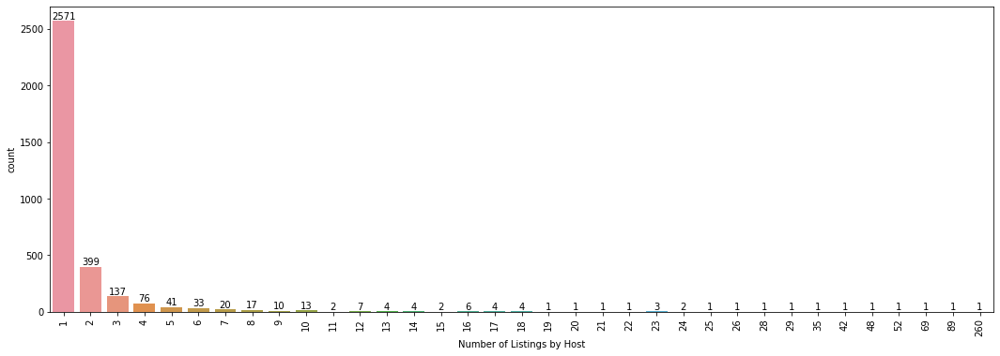

In [34]:
plt.figure(figsize=(18,6))
p = sb.countplot(x=listings_by_host, order=sorted(listings_by_host.unique()))
p.set_xticklabels(labels=p.get_xticklabels(),rotation=90)
p.bar_label(p.containers[0])
plt.xlabel('Number of Listings by Host')
plt.show()

It is obvious that a vast majority of hosts have only one listing in the Chicago area.  Let us look at the outliers.

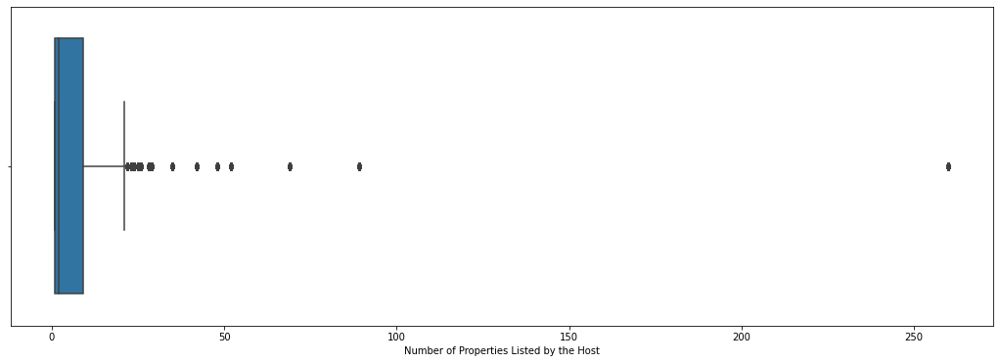

In [35]:
plt.figure(figsize=(18,6))
sb.boxplot(x=dat['calculated_host_listings_count'])
plt.xlabel('Number of Properties Listed by the Host')
plt.show()

In [36]:
#Calculate the lower and upper quartile values
q1 = np.quantile(dat['calculated_host_listings_count'], 0.25)
q3 = np.quantile(dat['calculated_host_listings_count'], 0.75)
#calculate the upper whisker only, since no outliers are below the lower
whishi = q3 + 1.5*(q3-q1)
#create a dataframe where the income is higher than the upper whisker value
out_list = dat[dat['calculated_host_listings_count']>whishi]
print('The upper whisker on the box plot is at ' + str(whishi) + ', with ' +
      str(len(out_list['id'])) + ' listings as outliers past this value.')

The upper whisker on the box plot is at 21.0, with 842 listings as outliers past this value.


<h4>Listing License</h4>

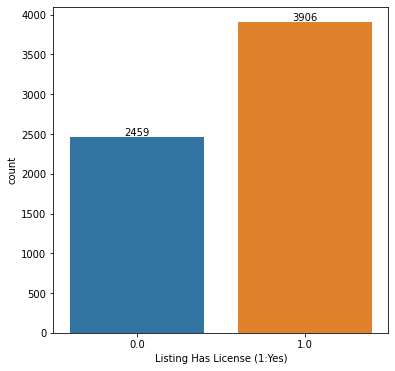

In [37]:
plt.figure(figsize=(6,6))
p = sb.countplot(x='license',data = dat)
p.bar_label(p.containers[0])
plt.xlabel('Listing Has License (1:Yes)')
plt.show()

A majority of the listings have a license, but it is not a large majority.

<h4>Host Response Time</h4>

In [38]:
dat['host_response_time'].unique()

array(['within an hour', 'within a few hours', nan, 'within a day',
       'a few days or more'], dtype=object)

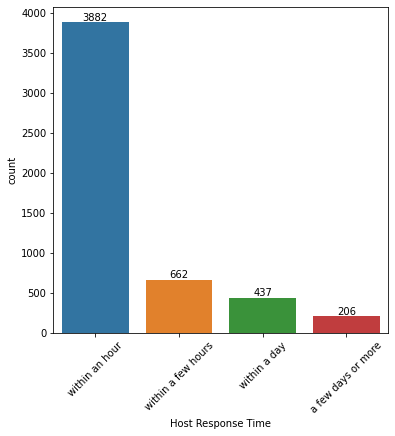

In [39]:
plt.figure(figsize=(6,6))
p = sb.countplot(x='host_response_time',data = dat)
p.set_xticklabels(labels=p.get_xticklabels(),rotation=45)
p.bar_label(p.containers[0])
plt.xlabel('Host Response Time')
plt.show()

Here we can see there are four categories for the response time.  Let's define a system for rating the response time by using floating numbers.  We will assign the values in hours and as follows:
 * 'within an hour' = 1 hour
 * 'within a few hours' = 5 hours
 * 'within a day' = 24 hours
 * 'a few days or more' = 48 hours

In [40]:
dat['host_response_time_float'] = dat['host_response_time'].map({'within an hour':1,'within a few hours':5,
                                                           'within a day':24,'a few days or more':48}).astype('float')
dat['host_response_time_float'].unique()

array([ 1.,  5., nan, 24., 48.])

<h4>Host Verifications</h4>

In order to simplify future analysis, let us count the number of verifications the host has and list this in a new column.

In [41]:
dat['host_verifications'].sample(5)

5208    ['email', 'phone', 'reviews', 'jumio', 'offlin...
1475    ['email', 'phone', 'google', 'reviews', 'offli...
797     ['email', 'phone', 'facebook', 'reviews', 'kba...
50      ['email', 'phone', 'facebook', 'reviews', 'jum...
5825                                   ['email', 'phone']
Name: host_verifications, dtype: object

We can see that the verifications are separated by a comma, so we will use this to count the number of verifications each host has.

In [42]:
dat['no_of_verif'] = dat['host_verifications'].str.count(r',') + 1
dat.loc[:, ['host_verifications','no_of_verif']].head()

,host_verifications,no_of_verif
0,"['email', 'phone', 'reviews', 'manual_offline'...",6
1,"['email', 'phone', 'reviews', 'jumio', 'offlin...",8
2,"['email', 'phone', 'reviews', 'jumio', 'govern...",6
3,"['email', 'phone', 'reviews', 'offline_governm...",7
4,"['email', 'phone', 'facebook', 'reviews', 'kba']",5


In order to catch any observations where hosts have no verifications, we will set the number of verifications to zero where the host_verifications = 'None'.  This is important since the code above would have counted both 'none' and an observation without a comma (i.e. only one verification) as 1.

In [43]:
dat['no_of_verif'] = np.where(dat['host_verifications'] == 'None', 0, dat['no_of_verif'])

In [44]:
dat['no_of_verif'].describe()

count    6365.000000
mean        5.586646
std         2.312465
min         1.000000
25%         4.000000
50%         6.000000
75%         7.000000
max        12.000000
Name: no_of_verif, dtype: float64

On average, hosts have about 5-6 different identity verifications. 

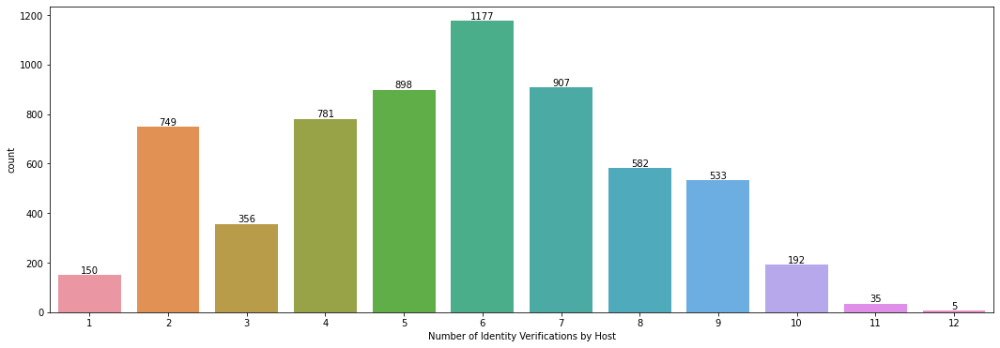

In [45]:
plt.figure(figsize=(18,6))
p = sb.countplot(x='no_of_verif',data = dat)
p.bar_label(p.containers[0])
plt.xlabel('Number of Identity Verifications by Host')
plt.show()

<h4>Amenities</h4>

Here we repeat the same process for number of amenities listed.

In [46]:
dat['no_of_amen'] = dat['amenities'].str.count(r',') + 1
dat.loc[:, ['amenities','no_of_amen']].head()

,amenities,no_of_amen
0,"[""Hot water kettle"", ""Wine glasses"", ""Kitchen""...",51
1,"[""Kitchen"", ""Free street parking"", ""Long term ...",30
2,"[""Kitchen"", ""Free street parking"", ""Shampoo"", ...",33
3,"[""Kitchen"", ""Long term stays allowed"", ""Smoke ...",31
4,"[""Free street parking"", ""Shampoo"", ""Smoke alar...",22


In [47]:
dat['no_of_amen'].describe()

count    6365.000000
mean       31.141241
std        10.613992
min         1.000000
25%        24.000000
50%        31.000000
75%        37.000000
max        82.000000
Name: no_of_amen, dtype: float64

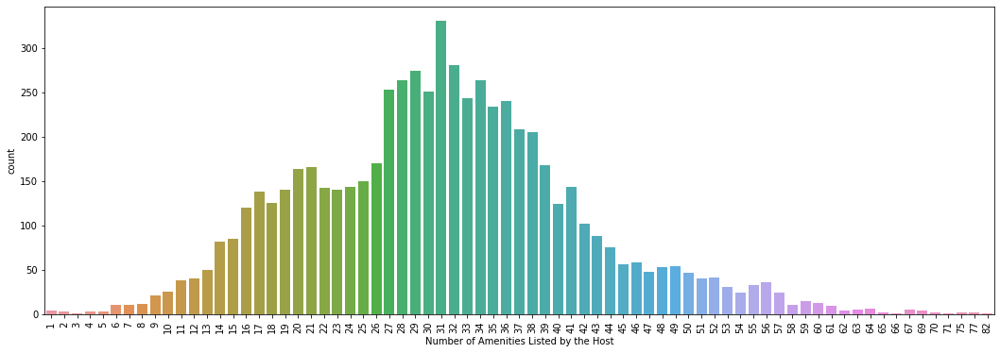

In [48]:
plt.figure(figsize=(18,6))
p = sb.countplot(x='no_of_amen',data = dat)
p.set_xticklabels(labels=p.get_xticklabels(),rotation=90)
plt.xlabel('Number of Amenities Listed by the Host')
plt.show()

Let us take a closer look to see what outliers are in this variable.

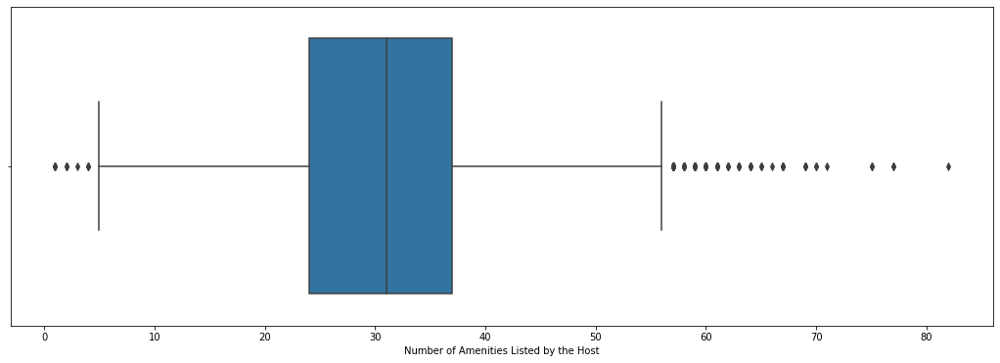

In [49]:
plt.figure(figsize=(18,6))
sb.boxplot(x=dat['no_of_amen'])
plt.xlabel('Number of Amenities Listed by the Host')
plt.show()

In [50]:
#Calculate the lower and upper quartile values
q1 = np.quantile(dat['no_of_amen'], 0.25)
q3 = np.quantile(dat['no_of_amen'], 0.75)
#calculate the upper whisker only, since no outliers are below the lower
whishi = q3 + 1.5*(q3-q1)
whislo = q1 - 1.5*(q3-q1)
#create a dataframe where the income is higher than the upper whisker value
out_list_hi = dat[dat['no_of_amen']>whishi]
out_list_lo = dat[dat['no_of_amen']<whislo]

print('\nThe upper whisker on the box plot is at ' + str(whishi) + ', with ' +
      str(len(out_list_hi['id'])) + ' listings as outliers above this value.')
print('\n')
print('The lower whisker on the box plot is at ' + str(whislo) + ', with ' +
      str(len(out_list_lo['id'])) + ' listings as outliers below this value.')


The upper whisker on the box plot is at 56.5, with 109 listings as outliers above this value.


The lower whisker on the box plot is at 4.5, with 11 listings as outliers below this value.


<h4>Distance from Center of Chicago</h4>

Let's calculate the distance of the listings from the center of the city of Chicago.  We will use the following coordinates: 41.8781° N, 87.6298° W.

We will use the Haversine formula to calculate the distance in miles.  In order to do so, we will first define a function to perform the calculation.

In [51]:
# Coordinates for center of Chicago in degrees
lat1 = 41.881832
long1 = -87.623177

# Constant, radius of the Earth in miles
r = 3958.8

# Define a function to calculate the distance
def haversine(lat2, long2):
    # First convert degrees into radians:
    rlat1 = lat1 * (math.pi / 180)
    rlat2 = lat2 * (math.pi / 180)
    rlong1 = long1 * (math.pi / 180)
    rlong2 = long2 * (math.pi / 180)
    
    # Calculate the differnce between the latitudes and longitudes
    dlat = rlat1 - rlat2
    dlong = rlong1 - rlong2
    
    # Use the Haversine formula (broken into 3 terms for simplification here)
    a = (math.sin(dlat / 2) ** 2)         # First term
    b = math.cos(rlat1) * math.cos(rlat2) # Second term
    c = (math.sin(dlong / 2) ** 2)        # Third term
    e = math.sqrt(a + b * c)
    d = 2 * r * e                         # where r is the radius of the Earth
    return d

Then, apply the formula to each observation in the data set, returning the answer in a new column for the distance from the center of the city.

In [52]:
dat['d_center'] = dat.apply(
    lambda row: haversine(row['latitude'], row['longitude']),
    axis=1)
dat['d_center'].sample(5)

4065    1.245009
1205    6.115364
6141    5.325414
4924    1.226746
3839    8.541637
Name: d_center, dtype: float64

In [53]:
dat['d_center'].describe()

count    6365.000000
mean        4.382709
std         2.735817
min         0.091059
25%         2.182025
50%         4.095625
75%         6.078114
max        16.529282
Name: d_center, dtype: float64

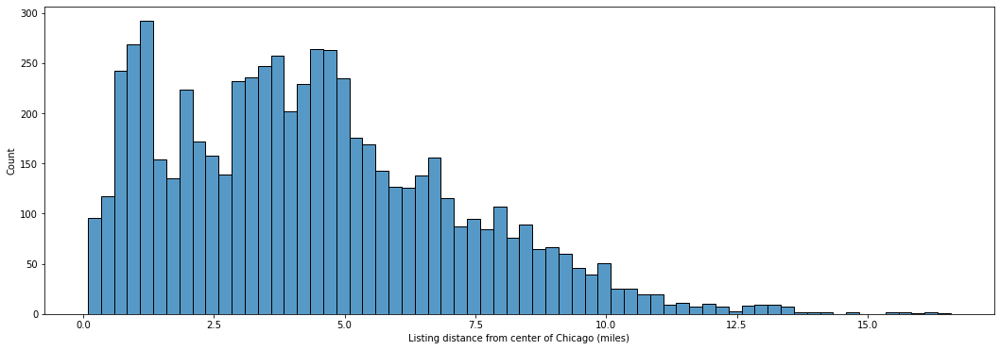

In [54]:
plt.figure(figsize=(18,6))
p = sb.histplot(x='d_center',data = dat,binwidth=0.25)
plt.xlabel('Listing distance from center of Chicago (miles)')
plt.show()

The plot shows a skew towards the center of the city, which makes sense that a larger number of listings would be closer to the center.

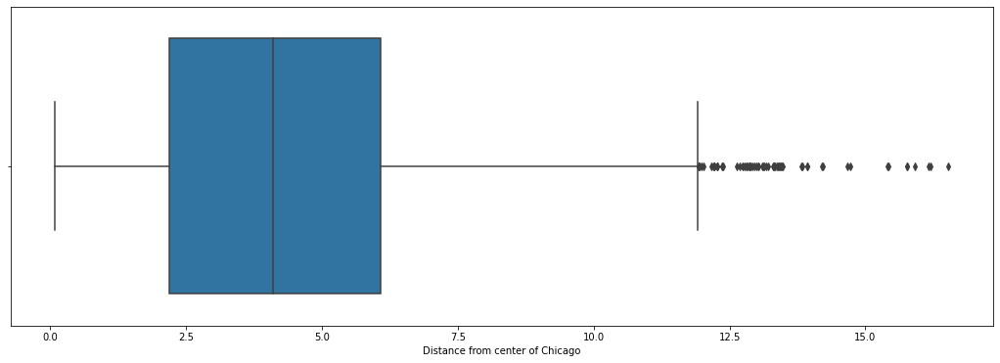

In [55]:
plt.figure(figsize=(18,6))
sb.boxplot(x=dat['d_center'])
plt.xlabel('Distance from center of Chicago')
plt.show()

In [56]:
#Calculate the lower and upper quartile values
q1 = np.quantile(dat['d_center'], 0.25)
q3 = np.quantile(dat['d_center'], 0.75)
#calculate the upper whisker only, since no outliers are below the lower
whishi = q3 + 1.5*(q3-q1)
whislo = q1 - 1.5*(q3-q1)
#create a dataframe where the income is higher than the upper whisker value
out_list_hi = dat[dat['d_center']>whishi]
out_list_lo = dat[dat['d_center']<whislo]

print('\nThe upper whisker on the box plot is at ' + str(round(whishi,2)) + ', with ' +
      str(len(out_list_hi['id'])) + ' listings as outliers above this value.')


The upper whisker on the box plot is at 11.92, with 64 listings as outliers above this value.


<h4>Property and Room Types</h4>

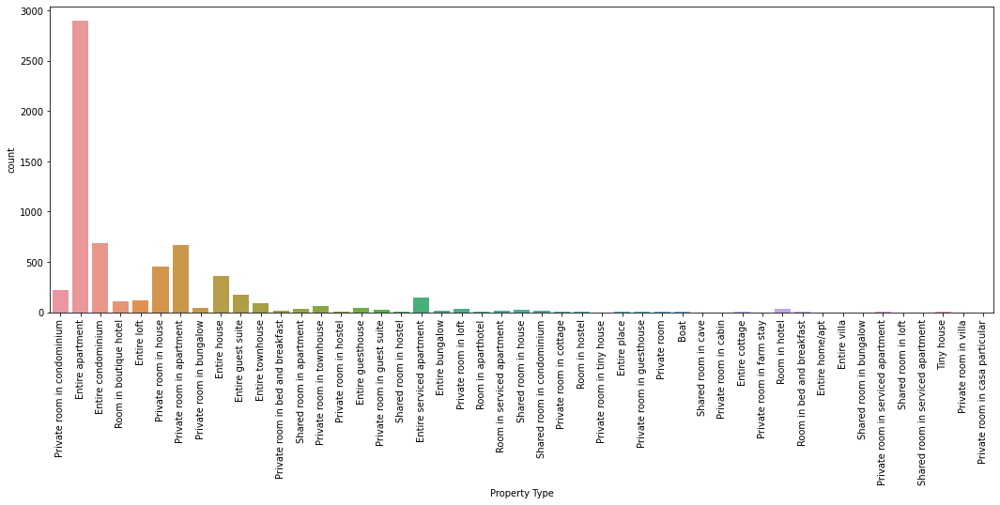

In [57]:
plt.figure(figsize=(18,6))
p = sb.countplot(x='property_type',data = dat)
p.set_xticklabels(labels=p.get_xticklabels(),rotation=90)
plt.xlabel('Property Type')
plt.show()

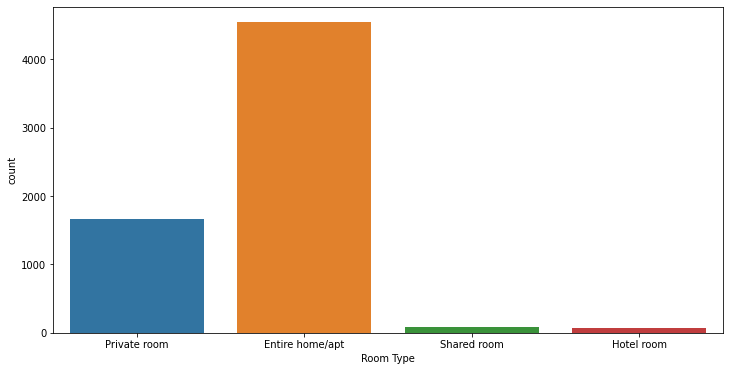

In [58]:
plt.figure(figsize=(12,6))
p = sb.countplot(x='room_type',data = dat)
plt.xlabel('Room Type')
plt.show()

In [59]:
print("The two graphs above show the most common type of listing is an entire apartment.  " + 
      "With the largest property type being 'entire apartment' at %s observations. \n"
     %(dat['property_type'].values == 'Entire apartment').sum())

print("In the room type category, there are %s observations for 'Entire home/apt'"
     %(dat['room_type'].values == 'Entire home/apt').sum())

The two graphs above show the most common type of listing is an entire apartment.  With the largest property type being 'entire apartment' at 2898 observations. 

In the room type category, there are 4541 observations for 'Entire home/apt'


<h3>Additional Box Plots</h3>

<h4>Price Outliers</h4>

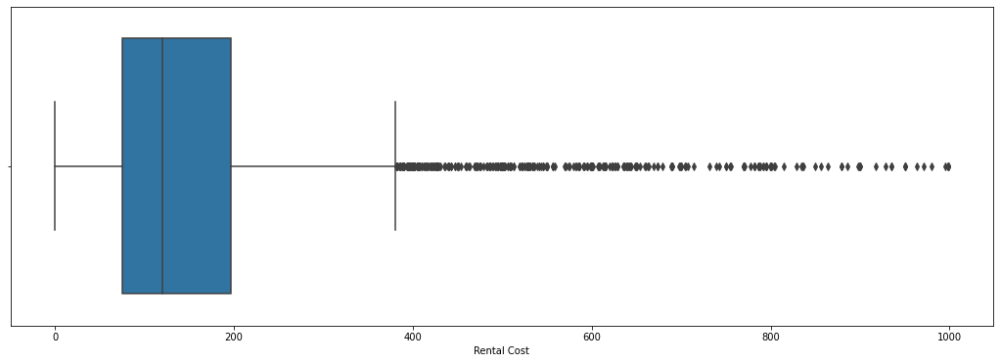

In [60]:
plt.figure(figsize=(18,6))
sb.boxplot(x=dat['price'])
plt.xlabel('Rental Cost')
plt.show()

In [61]:
#Calculate the lower and upper quartile values
q1 = np.quantile(dat['price'], 0.25)
q3 = np.quantile(dat['price'], 0.75)
#calculate the upper whisker only, since no outliers are below the lower
whishi = q3 + 1.5*(q3-q1)
#whislo = q1 - 1.5*(q3-q1)
#create a dataframe where the income is higher than the upper whisker value
out_list_hi = dat[dat['price']>whishi]
#out_list_lo = dat[dat['d_center']<whislo]

print('\nThe upper whisker on the box plot is at $' + str(whishi) + ', with ' +
      str(len(out_list_hi['id'])) + ' listings as outliers above this value.')


The upper whisker on the box plot is at $380.0, with 463 listings as outliers above this value.


In [62]:
dat['price'].describe()

count    6365.000000
mean      159.278240
std       137.654474
min         0.000000
25%        75.000000
50%       120.000000
75%       197.000000
max       999.000000
Name: price, dtype: float64

<h3>Regression Plots</h3>

<h4>Price v. Distance from center of city</h4>

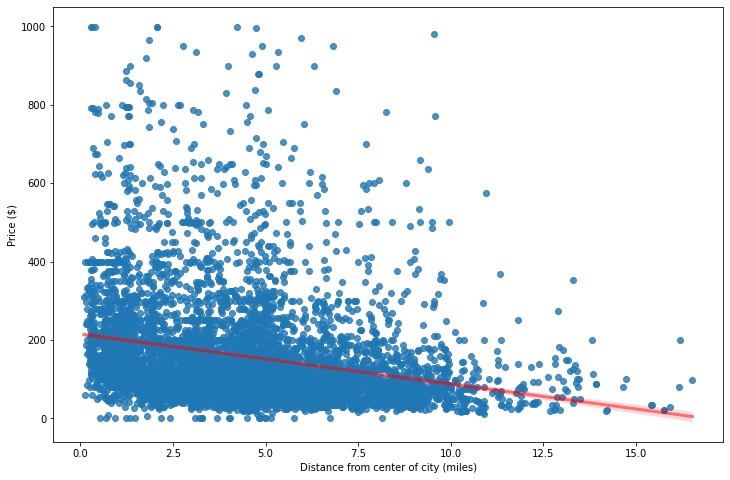

In [62]:
plt.figure(figsize=(12,8))
sb.regplot(x="d_center", y="price", 
            line_kws={"color":"r","alpha":0.5,"lw":3}, data=dat)
plt.xlabel('Distance from center of city (miles)')
plt.ylabel('Price ($)')
plt.show()

The regression plot shows a correlation between the distance from the center of the city and the price of the listing.  In general, the listings closer to the center of the city are worth more than the ones further away.  This makes sense, as property values are generally higher in more populated areas.

<h4>Regression Analysis and Prediction of Price based on distance from the city</h4>

We can use these data fields to make a prediction of price based on the distance from the city.

In [63]:
y = dat['price']
X = pd.DataFrame({'Distance':dat['d_center'],
                 'Const':1})

mod = sm.OLS(y,X)
fit = mod.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.064
Model:                            OLS   Adj. R-squared:                  0.064
Method:                 Least Squares   F-statistic:                     435.2
Date:                Sun, 05 Dec 2021   Prob (F-statistic):           1.50e-93
Time:                        04:50:31   Log-Likelihood:                -40166.
No. Observations:                6365   AIC:                         8.034e+04
Df Residuals:                    6363   BIC:                         8.035e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Distance     -12.7313      0.610    -20.863      0.000     -13.928     -11.535
Const        215.0760      3.153     68.218      0.000     208.895     221.256
==============================================================================
Omnibus:                     3338.804   Durbin-Watson:                   1.816
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            23932.376
Skew:                           2.452   Prob(JB):                         0.00
Kurtosis:                      11.136   Cond. No.                         10.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Based on the above OLS model, we can say that on average a property that is 1 mile further from the center of the city than another would be $12.73/night cheaper.

<h4>Price v. Number of Amenities</h4>

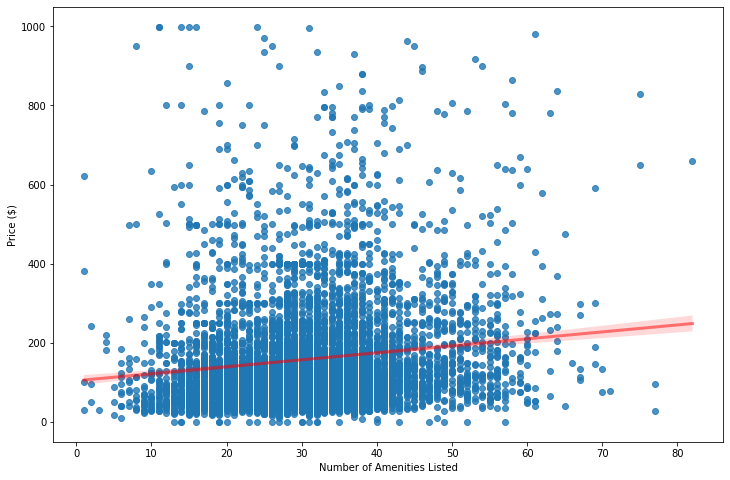

In [64]:
plt.figure(figsize=(12,8))
sb.regplot(x="no_of_amen", y="price", 
            line_kws={"color":"r","alpha":0.5,"lw":3}, data=dat)
plt.xlabel('Number of Amenities Listed')
plt.ylabel('Price ($)')
plt.show()

On average, the listings with more amenities listed are also posted for a higher rental price.

<h4>Regression Analysis and Prediction of Price based on Amenities</h4>

Again, we can use this data to develop a regression model to predict a property's price based on the number of amenities that are listed in the field.

In [65]:
y = dat['price']
X = pd.DataFrame({'Number of Amenities':dat['no_of_amen'],
                 'Const':1})

mod = sm.OLS(y,X)
fit = mod.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                  0.018
Method:                 Least Squares   F-statistic:                     119.7
Date:                Sun, 05 Dec 2021   Prob (F-statistic):           1.29e-27
Time:                        04:50:32   Log-Likelihood:                -40318.
No. Observations:                6365   AIC:                         8.064e+04
Df Residuals:                    6363   BIC:                         8.065e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Number of Amenities     1.7624      0.161     10.941      0.000       1.447       2.078
Const                 104.3953      5.299     19.699      0.000      94.007     114.784
==============================================================================
Omnibus:                     3258.084   Durbin-Watson:                   1.778
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            21967.585
Skew:                           2.403   Prob(JB):                         0.00
Kurtosis:                      10.729   Cond. No.                         102.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Here we can use this model to make predictions based on new properties.  For example, if a property were to have 35 amenities listed we can predict the listing price to be about (1.76 x 35) + 104.40 = $166/night.

<h4>Average Rating v. Response Time</h4>

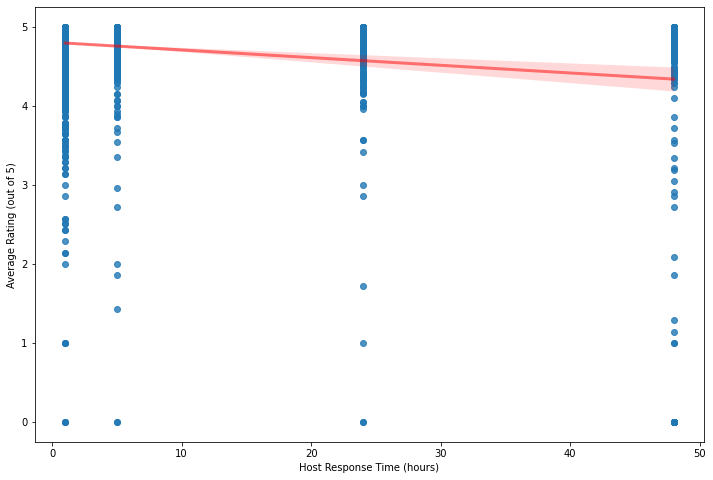

In [66]:
plt.figure(figsize=(12,8))
sb.regplot(x="host_response_time_float", y="avg_rating", 
            line_kws={"color":"r","alpha":0.5,"lw":3}, data=dat)
plt.xlabel('Host Response Time (hours)')
plt.ylabel('Average Rating (out of 5)')
plt.show()

The regression plot shows a negative trend in the average rating related to the time it takes the host to respond to messages and booking requests.

<h4>Average Rating v. Response Rate</h4>

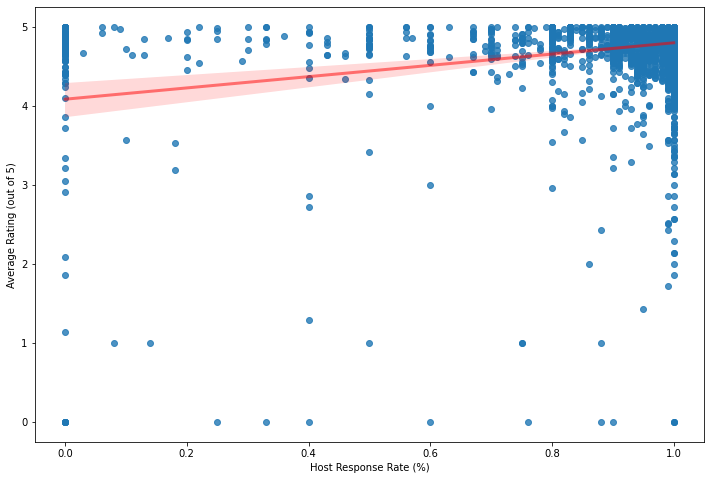

In [67]:
plt.figure(figsize=(12,8))
sb.regplot(x="host_response_rate", y="avg_rating", 
            line_kws={"color":"r","alpha":0.5,"lw":3}, data=dat)
plt.xlabel('Host Response Rate (%)')
plt.ylabel('Average Rating (out of 5)')
plt.show()

In general, the higher the hosts' response rate is, the higher their average listing rating is.

<h4>Average Rating v. Number of Verifications</h4>

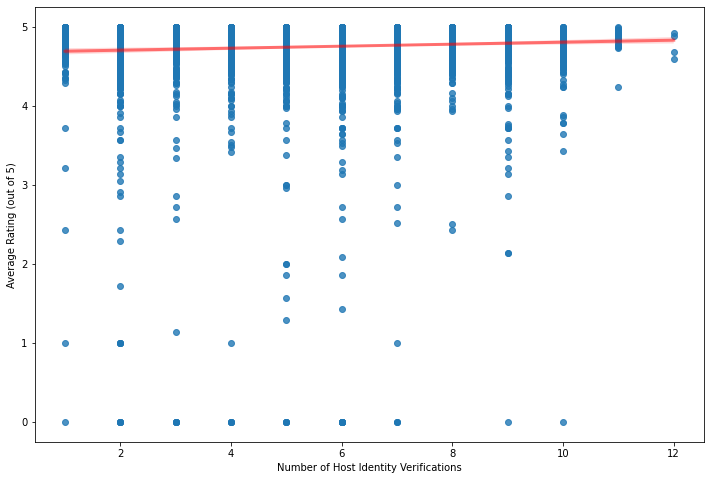

In [68]:
plt.figure(figsize=(12,8))
sb.regplot(x="no_of_verif", y="avg_rating", 
            line_kws={"color":"r","alpha":0.5,"lw":3}, data=dat)
plt.xlabel('Number of Host Identity Verifications')
plt.ylabel('Average Rating (out of 5)')
plt.show()

While it appears there is a positive correlation between the average rating and the number of verifications a host has, it is very small.

<h3>Word Clouds</h3>

Some of the columns are free text entered by the hosts.  We will look at the word clouds to explore which keywords are used most frequently.  The data fields we will focus on are:
- 'description': this is the hosts' description of their listings
- 'neighborhood_overview': the hosts' description of the neighborhood
- 'host_about': the hosts' description of themselves

First, let's define a function to make it easy to generate our wordclouds from the input column:

In [69]:
stopwords = STOPWORDS
stopwords.update(['description','neighborhood_overview','object','dtype','host_about',
                 'inv','t','name','don','neig','m','o','neig','nei'])
def Mywordcloud(data, title = None):   
    wc = WordCloud(
    background_color = "white",
    stopwords = stopwords,
    height = 600,
    width = 600
    ).generate(str(data))
    fig = plt.figure(1, figsize=(10, 10))
    plt.axis('off')
    if title:
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)
    plt.imshow(wc)
    plt.show()

<h4>Listing Description</h4>

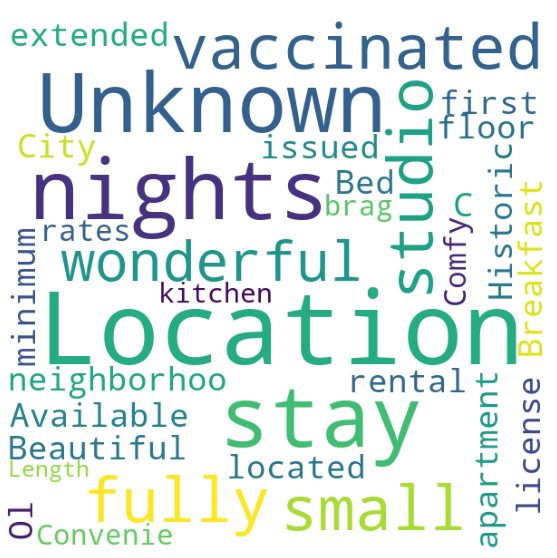

In [70]:
Mywordcloud(dat['description'].dropna())

In the description field, we see a lot of key words show up that would make sense to be in the field.  Interestingly the work "vaccinated" has already made it into the one of the most used words.

<h4>Neighborhood Overview</h4>

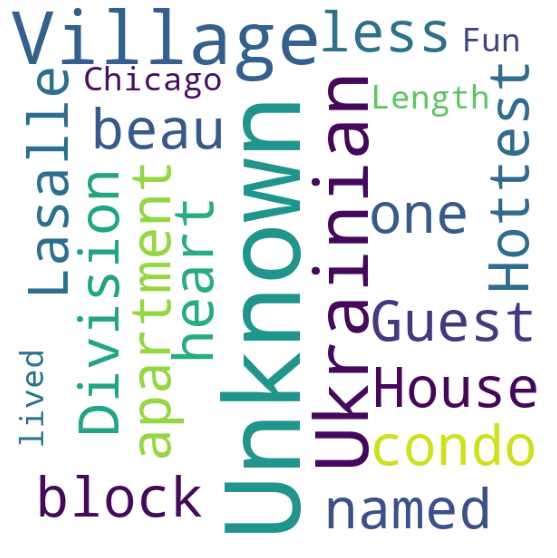

In [71]:
Mywordcloud(dat['neighborhood_overview'].dropna())

In the neighborhood overview, there are once again a lot of words that you would expect to show up when describing a location.  "Ukranian" is a village within Chicago, along with "Lasalle".

<h4>About the Host</h4>

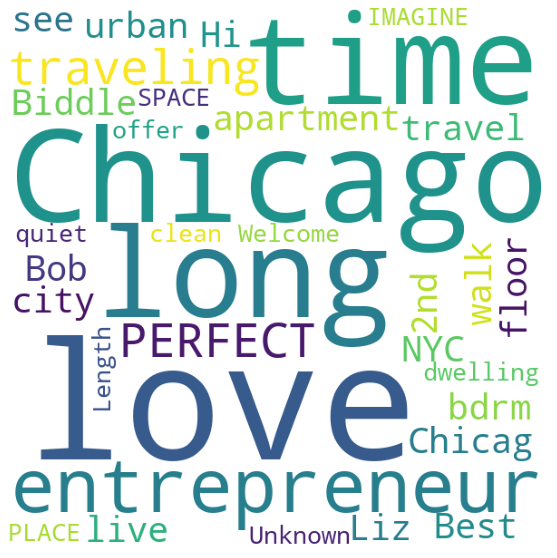

In [72]:
Mywordcloud(dat['host_about'].dropna())

Once again here we see common words to describe hosts, along with some of the more popular names in the area.

<h3>Joint Plots</h3>

<h4>Distance center from the city vs. Average rating</h4>

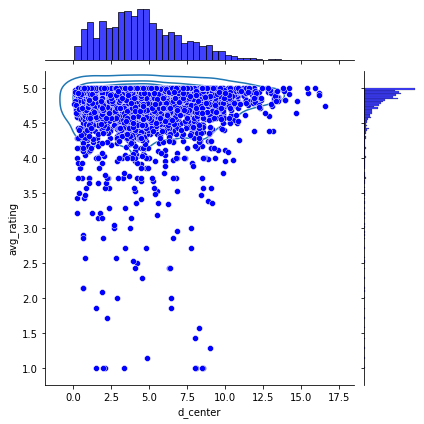

In [73]:
non_zero_avg = dat[dat['avg_rating']>0]
ax = sb.jointplot(x="d_center", y="avg_rating", data=non_zero_avg[['d_center','avg_rating']],color='b')
ax.plot_joint(sb.kdeplot, zorder=0, n_levels=6)
plt.xlabel('Distance from the center of Chicago')
plt.ylabel('Average Rating (out of 5)')
plt.show()

According to above plot, customers tend to rate the places that are closing to the center of Chicago with the score from 4 to 5 rating.

<h4>Accommodates vs. Average rating</h4>

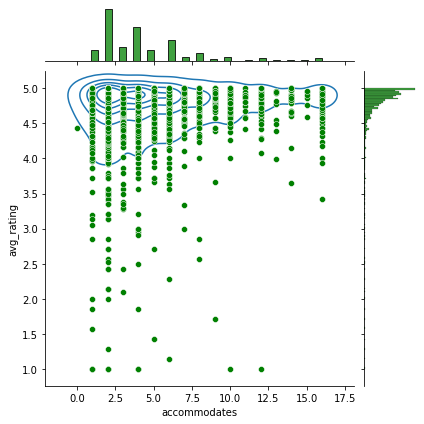

In [74]:
ax = sb.jointplot(x="accommodates", y="avg_rating", data=non_zero_avg[['accommodates','avg_rating']],color='g')
ax.plot_joint(sb.kdeplot, zorder=0, n_levels=6)
plt.xlabel('Accomodates (people)')
plt.ylabel('Average Rating (out of 5)')
plt.show()

Smaller accommodations tend to have higher average of rating score.

<h4>Accomodation vs. Availability for 30 days</h4>

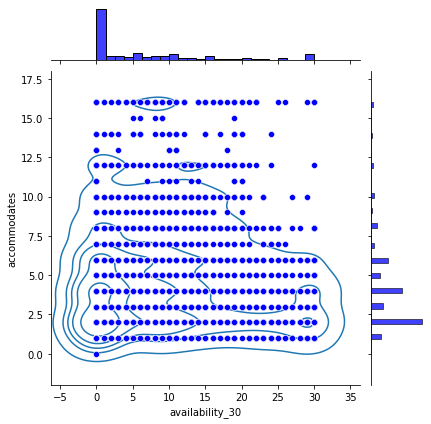

In [75]:
ax1 = sb.jointplot(x="availability_30", y="accommodates", data=dat[['availability_30','accommodates']],color='b')
ax1.plot_joint(sb.kdeplot, zorder=0, n_levels=6)
plt.xlabel('Availabillity Next 30d')
plt.ylabel('Accomodates (people)')
plt.show()

According to above plot, we can see there are big density starting from bottom left corner and spreading to the top and right. We can see that smaller accommodations have lower chance of being availability in 30 days.

<h4>Accommodation vs. Distance from center of Chicago</h4>

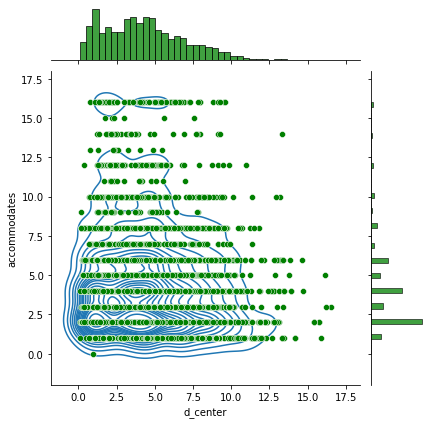

In [76]:
ax = sb.jointplot(x="d_center", y="accommodates", data=dat[['d_center','accommodates']],color='g')
ax.plot_joint(sb.kdeplot, zorder=0, n_levels=17)
plt.xlabel('Distance from the center of Chicago')
plt.ylabel('Accomodates (people)')
plt.show()

We can see that smaller accommodations tend to stay close to the city.

<h3>Heat Map</h3>

Geospatial visualization

The geography of Chicago has a wide spead city area with downtown and suburban locations available for properties to vary with higher pricing as we move towards the downtown. 
We will consider the following variables for observing varying prices for different locations
- 'latitude' geographic cordinates of the host's property location
- 'longitude' geographic cordinates of the host's property location
- 'price' Tagged price of the property hosted by hosts.

We take the 'latitude' and 'longitude' variables for identifying the property location hotspots, and 'price' variable to define the intensity of high and low priced rentals.

The Coordinates channel uses the location field, which contains arrays of latitude-longitude pairs. 

The Intensity field uses the price field, which contains rental price for each property.

In [77]:
# mark the loacation of each the property on the map of chicago
map = folium.Map([41.881832,-87.623177], zoomstart= 10)
for index, row in dat.iterrows():
    folium.CircleMarker([row['latitude'],row['longitude']],
                       radius=5,
                       popup=row['neighbourhood_cleansed'], color='#7ECC49',
                       fill_color="#FFFF00").add_to(map)
map

In [78]:
#starting lat and long are center of chicago
lat1 = 41.881832
long1 = -87.623177
map = folium.Map(location=[lat1, long1], zoom_start=10)
#convert data into list format
heat_data = [[row['latitude'],row['longitude'],row['price']] for index, row in dat.iterrows()]
#add to map, gradient for the price value
#plotting the heatmap
map.add_child(HeatMap(heat_data, radius = 15, gradient={'0':'Navy', '0.25':'Blue','0.50':'Green', '0.75':'Yellow','1': 'Red'}))
map

<h2 align='center'>Dimension Reduction</h2>

In [79]:
#dat.info()

<h3>Principal Component Analysis</h3>

In order to complete a Principal Component Analysis, we need to only select the numeric (non-datetime) values and drop values with NaNs.

In [80]:
# Select only numeric values
dat_pre_norm = dat.select_dtypes(exclude=['object'])

# Cannot scale datetime objects, so remove those columns
dat_pre_norm = dat_pre_norm.drop(['first_review','last_review','host_since','last_scraped'],axis=1)

# Drop off id columns
dat_pre_norm = dat_pre_norm.drop(['id','host_id'],axis=1)

# Drop remaining NaN values
dat_pre_norm = dat_pre_norm.dropna()

Next we will scale the data.

In [81]:
dat_norm = scale(dat_pre_norm)

<h4>PCA with all variables</h4>

For the fist PCA, we will include all of the variables (i.e. all columns from the selection above).

In [82]:
pca1 = PCA(n_components=len(dat_pre_norm.columns))

pca1.fit(dat_norm)

PCA(n_components=49)

In [83]:
var = pca1.explained_variance_ratio_
var1 = np.cumsum(np.round(pca1.explained_variance_ratio_, decimals=4)*100)
print(var1)

[ 15.23  24.39  32.16  39.3   45.84  51.22  55.54  59.06  62.25  65.38
  67.76  69.99  72.13  74.19  76.23  78.2   80.09  81.89  83.59  85.25
  86.8   88.13  89.39  90.49  91.51  92.41  93.26  94.06  94.78  95.45
  96.02  96.48  96.9   97.32  97.71  98.09  98.44  98.78  99.08  99.36
  99.62  99.83  99.98 100.03 100.03 100.03 100.03 100.03 100.03]


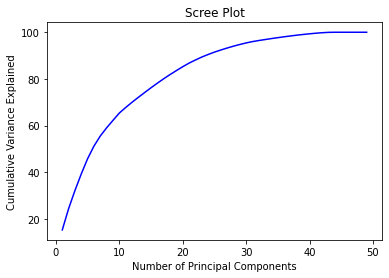

In [84]:
var1 = pd.DataFrame(var1, index=np.arange(1,int(len(dat_pre_norm.columns))+1))
plt.plot(var1,color='blue')
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Explained')
plt.show()

<h4>PCA with 80% variance explained</h4>

Taking the first 17 principal components will correspond to 80% of the variance explained.

In [85]:
pca17 = PCA(n_components=17)
pca17.fit(dat_norm)
data_pca17 = pca17.transform(dat_norm)

# Convert the numpy array to pandas DataFrame
data_pca17 = pd.DataFrame(data_pca17)
data_pca17.columns = ["PC"+str(i) for i in range(1,18)]

In [86]:
data_pca17.corr()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
PC1,1.000000e+00,1.861060e-11,6.437654e-12,2.186148e-11,-9.821485e-11,1.206764e-10,3.866125e-10,3.097271e-10,2.945688e-09,-1.122916e-09,2.291568e-09,-1.445180e-10,1.303612e-08,8.627470e-09,-2.010069e-09,1.671415e-08,-4.273241e-08
PC2,1.861060e-11,1.000000e+00,1.960579e-10,3.502222e-10,-2.373421e-10,-4.824406e-11,7.126488e-09,6.263003e-09,1.310831e-08,-5.955989e-09,8.215571e-09,-3.458121e-08,5.514602e-08,-2.198879e-08,-1.393894e-07,3.768978e-08,-8.618116e-08
PC3,6.437654e-12,1.960579e-10,1.000000e+00,5.823914e-10,2.136779e-10,-4.170334e-10,1.331112e-08,2.157673e-08,3.486506e-09,-1.020749e-08,-2.629669e-08,-9.146174e-08,5.191095e-08,-5.950239e-08,-3.196000e-07,-2.577362e-08,6.774982e-08
PC4,2.186148e-11,3.502222e-10,5.823914e-10,1.000000e+00,-5.069221e-11,-6.138706e-10,1.853827e-08,1.758094e-08,1.690632e-08,-1.006862e-08,-1.221206e-08,-9.845337e-08,8.882906e-08,-1.180246e-07,-4.093226e-07,1.502500e-08,4.118762e-09
PC5,-9.821485e-11,-2.373421e-10,2.136779e-10,-5.069221e-11,1.000000e+00,-3.056339e-09,1.471145e-09,1.061767e-08,-5.976117e-08,1.544055e-08,-5.784123e-08,-6.916990e-08,-2.469292e-07,-2.227000e-07,-1.874533e-07,-3.876593e-07,9.748952e-07
PC6,1.206764e-10,-4.824406e-11,-4.170334e-10,-6.138706e-10,-3.056339e-09,1.000000e+00,-1.296220e-08,-1.089395e-08,6.242491e-08,-2.091889e-08,4.332610e-10,1.252895e-07,3.608113e-07,4.875242e-07,4.470918e-07,5.906014e-07,-1.480170e-06
PC7,3.866125e-10,7.126488e-09,1.331112e-08,1.853827e-08,1.471145e-09,-1.296220e-08,1.000000e+00,4.801855e-07,2.857288e-07,-2.556554e-07,-3.883759e-07,-2.399062e-06,1.799448e-06,-2.183466e-06,-9.105039e-06,-5.988435e-08,7.556971e-07
PC8,3.097271e-10,6.263003e-09,2.157673e-08,1.758094e-08,1.061767e-08,-1.089395e-08,4.801855e-07,1.000000e+00,-2.093791e-08,-8.458914e-07,-9.401843e-07,-4.747499e-06,2.147587e-06,1.760542e-06,-1.189479e-05,-1.806828e-06,9.761724e-07
PC9,2.945688e-09,1.310831e-08,3.486506e-09,1.690632e-08,-5.976117e-08,6.242491e-08,2.857288e-07,-2.093791e-08,1.000000e+00,-5.482185e-07,1.724510e-06,-1.018490e-09,7.712109e-06,3.445688e-06,-2.073449e-06,1.009814e-05,-2.470888e-05
PC10,-1.122916e-09,-5.955989e-09,-1.020749e-08,-1.006862e-08,1.544055e-08,-2.091889e-08,-2.556554e-07,-8.458914e-07,-5.482185e-07,1.000000e+00,-1.509593e-07,2.153249e-06,-3.473096e-06,-3.448954e-06,4.857561e-06,-2.466030e-06,8.648701e-06


From the above correlation table, we can find that the pairwise correlations between two components are close to zeros. This means that all these components are orthogonal (not correlated). There is no multicollinearity among principal components.

In order to graph the results, we will restrict the PCA analysis to two components.

<h4>PCA with 2 components</h4>

In [87]:
# Select the number of components
pca2 = PCA(n_components=2)
pca2.fit(dat_norm)
dat_pca2 = pca2.fit_transform(dat_norm)

dat_pca2 = pd.DataFrame(dat_pca2)
dat_pca2.columns = ["PC"+str(i) for i in range(1,3)]

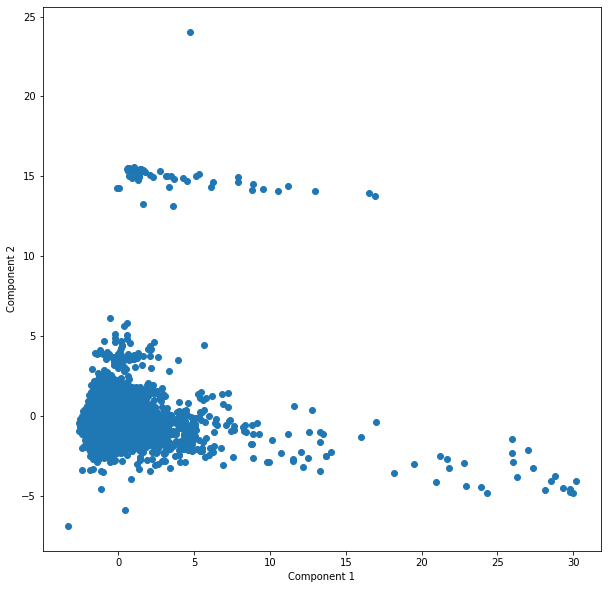

In [88]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(dat_pca2['PC1'], dat_pca2['PC2'])
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

It appears that there are three distinct groups in the graph, which are determined by the PCA2 values.

We can look at the loadings used to calculate the components from the original variables:

In [89]:
pd.DataFrame(pca2.components_.transpose(),
             index=dat_pre_norm.loc[:,:].columns,
             columns=["PC"+str(i) for i in range(1,3)])

,PC1,PC2
host_response_rate,-0.155522,0.078389
host_acceptance_rate,-0.091037,0.029255
host_is_superhost,-0.132681,-0.007664
host_has_profile_pic,-0.008635,0.004877
host_identity_verified,-0.009329,0.052846
latitude,-0.053461,-0.013080
longitude,0.058440,0.066726
accommodates,-0.022032,-0.146389
bedrooms,-0.026782,-0.136113
beds,-0.024945,-0.141265


In [90]:
dat_pca2[dat_pca2['PC2']>20]

,PC1,PC2
2241,4.749607,24.041013


In [91]:
#dat_pre_norm.loc[dat_pre_norm.index[dat_pca2[dat_pca2['PC2']>15].index]].transpose()

<h2 align="center">Predictive Methods</h2>

In this section, we will look at different predictive models for various target variables.



<h3>K-Nearest Neighbors - Rating Prediction</h3>

We will use KNN modeling to build a model to predict the average rating of new listings based on the other predictors.  First we need to load the appropriate packages.

In [92]:
from sklearn import neighbors
from sklearn import model_selection
from sklearn import metrics
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

Next we will divide the variables into the independent (X) and dependent, or target, variable (y).  In this model, we will be attempting to predict 'price'.

We also already selected the appropriate columns for the PCA analysis earlier, and can start with the same pre-normalized data.

In [93]:
X_svm = dat_pre_norm.drop(['review_scores_rating'],axis=1)
y_svm = dat_pre_norm['review_scores_rating']

Since the other rating predictors would not be available for future data, these should be dropped from the predictors as well.

In [94]:
X_svm = dat_pre_norm.drop(['review_scores_accuracy','review_scores_cleanliness',
                           'review_scores_checkin','review_scores_communication',
                           'review_scores_location','review_scores_value'],
                           axis=1)

In order to test the performance of our model, we need to split the original dataset into test and train subsets.  We will use a 20/80 test/train split.

In [95]:
y_svm_train,y_svm_test,X_svm_train,X_sm_test = train_test_split(y_svm, X_svm,
                                                 test_size=0.2,
                                                 random_state=123)

In [96]:
pd.DataFrame([y_svm_train.describe(),y_svm_test.describe()],
            index=['train description','test description'])

,count,mean,std,min,25%,50%,75%,max
train description,3430.0,4.716606,0.488704,0.0,4.66,4.84,4.97,5.0
test description,858.0,4.703939,0.504051,0.0,4.67,4.84,4.97,5.0


Above we can see that the split is fairly eqaully distibuted.

Next we will scale the data for the analysis.

In [97]:
# Create scalar
scaler = preprocessing.MinMaxScaler().fit(X_svm_train)

# Scale training data
X_train_scale = scaler.transform(X_svm_train)
X_train_scale = pd.DataFrame(X_train_scale)
X_train_scale.columns = X_svm_train.columns

# Scale test data
X_test_scale = scaler.transform(X_sm_test)
X_test_scale = pd.DataFrame(X_test_scale)
X_test_scale.columns = X_sm_test.columns

Now we will iterate through various values of k in order to tune the model.

In [98]:
for k in range(20):
    k = k + 1
    knn = neighbors.KNeighborsRegressor(n_neighbors = k, 
                                         weights = 'uniform', 
                                         algorithm = 'auto')
    knn.fit(X_train_scale, y_svm_train)
    pred_y = knn.predict(X_test_scale)
    if k==1:
        k_final = k
        RMSE_final = round(metrics.mean_squared_error(y_svm_test, pred_y,squared=False),3)
    else:
        if round(metrics.mean_squared_error(y_svm_test, pred_y,squared=False),3) < RMSE_final:
            k_final = k
            RMSE_final = round(metrics.mean_squared_error(y_svm_test, pred_y,squared=False),3)
    print("RMSE is ", round(metrics.mean_squared_error(y_svm_test, pred_y,squared=False),3)," for k =",k)

RMSE is  0.388  for k = 1
RMSE is  0.383  for k = 2
RMSE is  0.399  for k = 3
RMSE is  0.404  for k = 4
RMSE is  0.403  for k = 5
RMSE is  0.409  for k = 6
RMSE is  0.404  for k = 7
RMSE is  0.402  for k = 8
RMSE is  0.406  for k = 9
RMSE is  0.406  for k = 10
RMSE is  0.405  for k = 11
RMSE is  0.407  for k = 12
RMSE is  0.409  for k = 13
RMSE is  0.412  for k = 14
RMSE is  0.415  for k = 15
RMSE is  0.418  for k = 16
RMSE is  0.42  for k = 17
RMSE is  0.421  for k = 18
RMSE is  0.422  for k = 19
RMSE is  0.423  for k = 20


In [99]:
print("The best k value is ", k_final, " with a RMSE of ", RMSE_final)

The best k value is  2  with a RMSE of  0.383


<h3> Random Forest Classifier- predicting the most preferred room type for customers</h3>

We will use RandomForestClassifier to predict the most preferred room type based on customer satisfaction (ratings and reviews).

In [100]:
from sklearn.ensemble import RandomForestClassifier

In [101]:
X_rf = dat.drop(['property_type','id','last_scraped','name','description','neighborhood_overview','host_id',
                'host_name','host_since','host_about','host_location','host_response_time',
                 'host_response_rate','host_acceptance_rate','host_is_superhost','host_neighbourhood',
                 'host_verifications','host_has_profile_pic','host_identity_verified','neighbourhood_cleansed',
                 'latitude','longitude','room_type','accommodates','bathrooms_text','bedrooms','beds','amenities',
                 'price','minimum_nights','maximum_nights','minimum_minimum_nights','maximum_minimum_nights',
                 'minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm','maximum_nights_avg_ntm',
                 'has_availability','availability_30','availability_60','availability_90','availability_365',
                 'first_review','last_review','license','instant_bookable','calculated_host_listings_count',
                 'calculated_host_listings_count_entire_homes','calculated_host_listings_count_private_rooms',
                 'calculated_host_listings_count_shared_rooms','bathrooms','host_age','host_response_inADay',
                 'host_response_time_float','no_of_verif','no_of_amen','d_center'], axis =1)

y_rf = dat['room_type']

In [102]:
X_rf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6365 entries, 0 to 6365
Data columns (total 12 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   number_of_reviews            6365 non-null   int64  
 1   number_of_reviews_ltm        6365 non-null   int64  
 2   number_of_reviews_l30d       6365 non-null   int64  
 3   review_scores_rating         6365 non-null   float64
 4   review_scores_accuracy       6365 non-null   float64
 5   review_scores_cleanliness    6365 non-null   float64
 6   review_scores_checkin        6365 non-null   float64
 7   review_scores_communication  6365 non-null   float64
 8   review_scores_location       6365 non-null   float64
 9   review_scores_value          6365 non-null   float64
 10  reviews_per_month            6365 non-null   float64
 11  avg_rating                   5282 non-null   float64
dtypes: float64(9), int64(3)
memory usage: 904.5 KB


We can see that there are some missing values in the predictors, so we fill those missing values.

In [103]:
X_rf['avg_rating']=X_rf['avg_rating'].fillna(method='ffill')

In [104]:
nullseries = X_rf.isnull().sum()
print(nullseries[nullseries > 0])

Series([], dtype: int64)


We now split the data into train and test datasets by splitting the 80% train and 20% test data via train_test_split() method 

In [105]:
train_y, test_y, train_X, test_X= train_test_split(y_rf, X_rf,
                                                   test_size=0.2,
                                                   random_state=123) 

In [106]:
train_X.shape

(5092, 12)

In [107]:
train_y.shape

(5092,)

In [108]:
train_y.unique()

array(['Entire home/apt', 'Private room', 'Shared room', 'Hotel room'],
      dtype=object)

In [109]:
test_X.shape

(1273, 12)

In [110]:
test_y.shape

(1273,)

We scale the training and testing data for obtaining optimal results from the RF model.

In [111]:
scaler = preprocessing.MinMaxScaler().fit(train_X)

train_X_scale = scaler.transform(train_X)
train_X_scale = pd.DataFrame(train_X_scale)
train_X_scale.columns = train_X.columns

train_X_scale.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
number_of_reviews,5092.0,0.063014,0.103418,0.0,0.002915,0.018950,0.080175,1.0
number_of_reviews_ltm,5092.0,0.022267,0.043995,0.0,0.000000,0.004975,0.027363,1.0
number_of_reviews_l30d,5092.0,0.020388,0.038341,0.0,0.000000,0.000000,0.033898,1.0
review_scores_rating,5092.0,0.780242,0.368781,0.0,0.866000,0.958000,0.990000,1.0
review_scores_accuracy,5092.0,0.790375,0.372505,0.0,0.900000,0.974000,0.996000,1.0
review_scores_cleanliness,5092.0,0.779584,0.368622,0.0,0.860000,0.958000,0.992000,1.0
review_scores_checkin,5092.0,0.800005,0.375376,0.0,0.926000,0.984000,1.000000,1.0
review_scores_communication,5092.0,0.799263,0.376249,0.0,0.920000,0.986000,1.000000,1.0
review_scores_location,5092.0,0.790397,0.371486,0.0,0.896000,0.970000,0.996000,1.0
review_scores_value,5092.0,0.775733,0.366382,0.0,0.866000,0.950000,0.978000,1.0


In [112]:
test_X_scale = scaler.transform(test_X)
test_X_scale = pd.DataFrame(test_X_scale)
test_X_scale.columns = test_X.columns

test_X_scale.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
number_of_reviews,1273.0,0.065563,0.108041,0.0,0.002915,0.020408,0.080175,1.497085
number_of_reviews_ltm,1273.0,0.025294,0.060574,0.0,0.000000,0.007463,0.029851,1.609453
number_of_reviews_l30d,1273.0,0.024432,0.067339,0.0,0.000000,0.000000,0.033898,2.016949
review_scores_rating,1273.0,0.780611,0.367258,0.0,0.866000,0.956000,0.988000,1.000000
review_scores_accuracy,1273.0,0.791417,0.371405,0.0,0.900000,0.972000,0.996000,1.000000
review_scores_cleanliness,1273.0,0.779705,0.367798,0.0,0.866000,0.958000,0.992000,1.000000
review_scores_checkin,1273.0,0.800539,0.374683,0.0,0.924000,0.984000,1.000000,1.000000
review_scores_communication,1273.0,0.801477,0.374145,0.0,0.920000,0.986000,1.000000,1.000000
review_scores_location,1273.0,0.789240,0.369249,0.0,0.886000,0.968000,0.994000,1.000000
review_scores_value,1273.0,0.774754,0.365139,0.0,0.866000,0.948000,0.978000,1.000000


In [113]:
rf = RandomForestClassifier(n_estimators=7, max_features=9, random_state=123)

In [114]:
rf.fit(train_X_scale, train_y)

RandomForestClassifier(max_features=9, n_estimators=7, random_state=123)

In [115]:
# We use feature importance method to define the best predictors.
rf.feature_importances_

feature_importances = pd.DataFrame(rf.feature_importances_,
                                   index = train_X_scale.columns,
                                   columns=['importance'])
feature_importances = feature_importances.sort_values('importance',ascending=False)

<AxesSubplot:title={'center':'Feature Importances of Ratings and Reviews for properties'}>

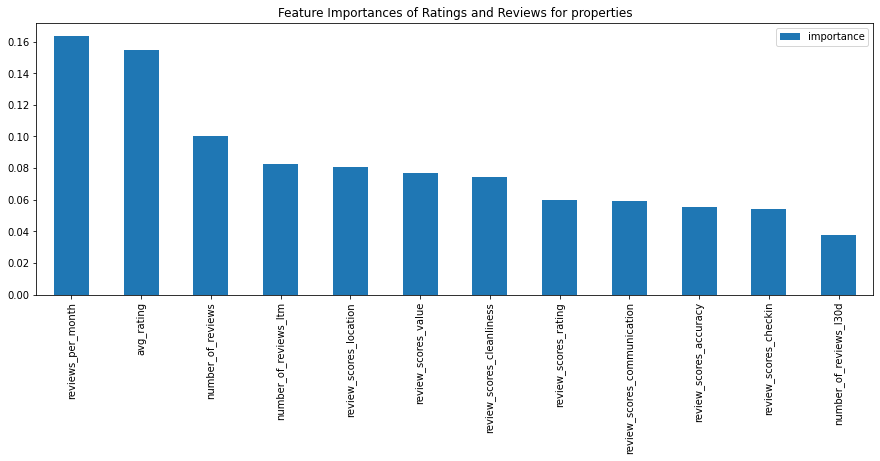

In [116]:
feature_importances.plot(kind = 'bar',figsize=(15,5),
                         title='Feature Importances of Ratings and Reviews for properties')

**From the above feature_importances method, we can see that avg_rating, reviews_per_month, number_of_reviews are variables of high importance and these variables have high significance in training RF classifier.**

In [117]:
pred_y_rf = rf.predict(test_X_scale)

In [118]:
metrics.accuracy_score(test_y, pred_y_rf)

0.6802827965435978

In [119]:
pred_y_rf

array(['Entire home/apt', 'Entire home/apt', 'Entire home/apt', ...,
       'Private room', 'Entire home/apt', 'Private room'], dtype=object)

In [120]:
# Based on model prediction, we count the number of values obtained for each room type.
p = pred_y_rf.tolist()

In [121]:
count = dict()
for i in p:
    count[i]=count.get(i,0)+1
count

{'Entire home/apt': 1069,
 'Private room': 198,
 'Shared room': 5,
 'Hotel room': 1}

In [122]:
data = count
pd.DataFrame.from_dict(data, orient='index', dtype=None, columns=['Preferred House type'])

,Preferred House type
Entire home/apt,1069
Private room,198
Shared room,5
Hotel room,1


Based on RF classifier result without hyper parameter tuning with get accuracy score of 70.44%, now let's tune hyper parameters and observe the difference in predicting the the most preferred room type based on ratings and reviews.

In [123]:
## RF Classifier with hyper-parameter tuning

In [124]:
parameters = {'criterion': ['gini', 'entropy'],
              'n_estimators':[100,200,300,400,500],
              'max_features':[1,3,5,7,9,10,11],
              'random_state':[123]}
parameters

{'criterion': ['gini', 'entropy'],
 'n_estimators': [100, 200, 300, 400, 500],
 'max_features': [1, 3, 5, 7, 9, 10, 11],
 'random_state': [123]}

In [125]:
rf2 = RandomForestClassifier()

In [126]:
from sklearn.model_selection import GridSearchCV

In [127]:
grid_rf = GridSearchCV(rf2, parameters, scoring='accuracy', cv=5)

In [128]:
import time
start = time.time()
print('Start time :'+ time.strftime('%m/%d/%Y %H:%M:%S'))

grid_rf.fit(train_X_scale, train_y)

end = time.time()
print('End time :'+ time.strftime('%m/%d/%Y %H:%M:%S'))
print('Execution Time in seconds :'+ str(end - start))

Start time :12/05/2021 04:51:05
End time :12/05/2021 05:11:38
Execution Time in seconds :1232.525512456894


In [129]:
grid_rf.best_params_

{'criterion': 'entropy',
 'max_features': 1,
 'n_estimators': 200,
 'random_state': 123}

In [130]:
pred_y_rf2 = grid_rf.predict(test_X_scale)

In [131]:
metrics.accuracy_score(test_y, pred_y_rf2)

0.6912804399057345

In [132]:
p = pred_y_rf2.tolist()

In [133]:
count = dict()
for i in p:
    count[i]=count.get(i,0)+1
count

{'Entire home/apt': 1174, 'Private room': 97, 'Shared room': 2}

In [134]:
data = count
pd.DataFrame.from_dict(data, orient='index', dtype=None, columns=['Preferred House type'])

,Preferred House type
Entire home/apt,1174
Private room,97
Shared room,2


**The RF Classifier with hyper parameter tuning gives us accuracy score of 72.76% with best optimal hyper parameters.**

The above result obtained from the model, we can depict that the preferred room type based on customer ratings and reviews is "Entire home/apt" followed by "Private room", "Hotel room", and lastly "Shared Room".

---


<h3>K-Nearest Neighbors - Price Prediction</h3>

We will use KNN modeling to build a model to predict the price of new listings based on the other predictors.

In [135]:
from sklearn.preprocessing import StandardScaler

**Preprocess Data**

In [136]:
X_price = dat_pre_norm.drop(['price'],axis=1)
y_price = dat_pre_norm['price']

**Data Partition**
We use the sklearn.model_selection.train_test_split() method to split the dataset into test and training sets. Major parameters are:

- test_size

- train_size

- random_state

In [137]:
y_price_train,y_price_test,X_price_train,X_price_test = train_test_split(y_price, X_price,
                                                 test_size=0.2,
                                                 random_state=123)

**Normalize Data**
Because the k-NN needs to calculate distance between observations, it's better to normalize data as we have variables measured in different scales.

In [138]:
pd.DataFrame([y_price_train.describe(),y_price_test.describe()],
            index=['train description','test description'])

,count,mean,std,min,25%,50%,75%,max
train description,3430.0,158.696501,137.490981,0.0,75.0,117.0,195.00,999.0
test description,858.0,158.265734,130.947322,0.0,76.0,123.0,194.75,935.0


In [139]:
# Create a scaler to do the transformation
scaler = StandardScaler().fit(X_price_train)
# Transform training X
X_price_train_scaled = scaler.transform(X_price_train)
X_price_train_scaled = pd.DataFrame(X_price_train_scaled)
X_price_train_scaled.columns = X_price_train.columns

In [140]:
# Transform test X
X_price_test_scaled = scaler.transform(X_price_test)
X_price_test_scaled = pd.DataFrame(X_price_test_scaled)
X_price_test_scaled.columns = X_price_test.columns

**Tune the k-NN Regressor**
The choice of the paramter value k has impact on the performance of the k-NN algorithm.
In the following, we tune the k parameter based on Root Mean Squared Error and R2.

In [141]:
from sklearn import neighbors
from sklearn import metrics
for k in range(20):
    k = k + 1
    knn = neighbors.KNeighborsRegressor(n_neighbors = k, 
                                         weights='uniform', 
                                         algorithm='auto')
    knn.fit(X_price_train_scaled, y_price_train)
    pred_y = knn.predict(X_price_test_scaled)
    rmse = metrics.mean_squared_error(y_price_test, pred_y, squared = False)
    
    print("Root Mean Squared Error: {:.2f}".format(rmse)," for k=",k)

Root Mean Squared Error: 100.87  for k= 1
Root Mean Squared Error: 92.13  for k= 2
Root Mean Squared Error: 86.84  for k= 3
Root Mean Squared Error: 83.11  for k= 4
Root Mean Squared Error: 83.42  for k= 5
Root Mean Squared Error: 82.20  for k= 6
Root Mean Squared Error: 82.51  for k= 7
Root Mean Squared Error: 82.78  for k= 8
Root Mean Squared Error: 82.86  for k= 9
Root Mean Squared Error: 83.62  for k= 10
Root Mean Squared Error: 84.38  for k= 11
Root Mean Squared Error: 84.23  for k= 12
Root Mean Squared Error: 84.49  for k= 13
Root Mean Squared Error: 84.22  for k= 14
Root Mean Squared Error: 83.85  for k= 15
Root Mean Squared Error: 83.83  for k= 16
Root Mean Squared Error: 84.30  for k= 17
Root Mean Squared Error: 84.52  for k= 18
Root Mean Squared Error: 84.57  for k= 19
Root Mean Squared Error: 84.54  for k= 20


In [142]:
for k in range(20):
    k = k + 1
    knn = neighbors.KNeighborsRegressor(n_neighbors = k, 
                                         weights='uniform', 
                                         algorithm='auto')
    knn.fit(X_price_train_scaled, y_price_train)
    pred_y = knn.predict(X_price_test_scaled)
    r2 = metrics.r2_score(y_price_test, pred_y)
    
    print("R2 score: {:.3f}".format(r2)," for k=",k)

R2 score: 0.406  for k= 1
R2 score: 0.504  for k= 2
R2 score: 0.560  for k= 3
R2 score: 0.597  for k= 4
R2 score: 0.594  for k= 5
R2 score: 0.606  for k= 6
R2 score: 0.602  for k= 7
R2 score: 0.600  for k= 8
R2 score: 0.599  for k= 9
R2 score: 0.592  for k= 10
R2 score: 0.584  for k= 11
R2 score: 0.586  for k= 12
R2 score: 0.583  for k= 13
R2 score: 0.586  for k= 14
R2 score: 0.590  for k= 15
R2 score: 0.590  for k= 16
R2 score: 0.585  for k= 17
R2 score: 0.583  for k= 18
R2 score: 0.582  for k= 19
R2 score: 0.583  for k= 20


- k=7 has highest performance based on R2 score and Root Mean Squared Error

### Decision Tree Prediction on Customer Satisfaction
Set related columns that might affect customers satisfaction to X.

In [143]:
X_DT = dat[['host_is_superhost','host_has_profile_pic','bedrooms','price','number_of_reviews',
            'review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication',
            'review_scores_location','review_scores_value','license','instant_bookable','bathrooms','host_response_inADay','no_of_verif',
            'no_of_amen']]

In [144]:
X_DT.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6365 entries, 0 to 6365
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   host_is_superhost            6365 non-null   float64
 1   host_has_profile_pic         6365 non-null   float64
 2   bedrooms                     6365 non-null   float64
 3   price                        6365 non-null   float64
 4   number_of_reviews            6365 non-null   int64  
 5   review_scores_accuracy       6365 non-null   float64
 6   review_scores_cleanliness    6365 non-null   float64
 7   review_scores_checkin        6365 non-null   float64
 8   review_scores_communication  6365 non-null   float64
 9   review_scores_location       6365 non-null   float64
 10  review_scores_value          6365 non-null   float64
 11  license                      6365 non-null   float64
 12  instant_bookable             6365 non-null   float64
 13  bathrooms         

Replace all value less than 4 to 0 and all value higher than 4 to 1 in "review_scores_rating" column. Then set it to y.

In [145]:
y_DT = pd.DataFrame(np.where((dat['review_scores_rating'] >= 4.0),1,0))
y_DT.rename(columns={0: 'Rating>4'}, inplace=True)
y_DT

,Rating>4
0,1
1,1
2,1
3,1
4,1
...,...
6360,0
6361,0
6362,0
6363,0


### Data Partition
Split both X and y into train and test set to check the model| performance.

In [146]:
# 20-80% simple split
# To make the result reproducible, set the random_state
DT_train_y,DT_test_y,DT_train_X,DT_test_X = train_test_split(y_DT, X_DT,
                                                 test_size=0.2,
                                                 random_state=123)

### Decision Tree Classifier

In [147]:
from sklearn import tree
dt = tree.DecisionTreeClassifier(criterion='entropy')
dt.fit(DT_train_X, DT_train_y)

DecisionTreeClassifier(criterion='entropy')

In [148]:
pred_y_DT = dt.predict(DT_test_X)

In [149]:
# Calculate AUC
metrics.roc_auc_score(DT_test_y, pred_y_DT)

0.9707481846870308

In [150]:
# Calculate classification accuracy
metrics.accuracy_score(DT_test_y, pred_y_DT)

0.98114689709348

In [151]:
# Calculate Cohen's Kappa
metrics.cohen_kappa_score(DT_test_y, pred_y_DT)

0.9414963693740617

In [152]:
# Print classification report
print(metrics.classification_report(DT_test_y, pred_y_DT))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95       257
           1       0.99      0.99      0.99      1016

    accuracy                           0.98      1273
   macro avg       0.97      0.97      0.97      1273
weighted avg       0.98      0.98      0.98      1273



#### Decision Tree classifier gives AUC score on 0.97, accuracy on 0.98
Based on the columns that might affect customer rating, to predict if a customer would rate a property higher than 4.0(which means customer satisfied with that property). 

## Decision Tree Model - Customer Group Prediction

Use the Decision Tree Classifier to classify which type of customer group is airbnb's ideal customers in Chicago

In [185]:
X_dt_acc = dat[['number_of_reviews','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication',
            'review_scores_location','review_scores_value','reviews_per_month','minimum_nights','maximum_nights','beds','bedrooms','bathrooms','no_of_amen']]
X_dt_acc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6365 entries, 0 to 6365
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   number_of_reviews            6365 non-null   int64  
 1   review_scores_accuracy       6365 non-null   float64
 2   review_scores_cleanliness    6365 non-null   float64
 3   review_scores_checkin        6365 non-null   float64
 4   review_scores_communication  6365 non-null   float64
 5   review_scores_location       6365 non-null   float64
 6   review_scores_value          6365 non-null   float64
 7   reviews_per_month            6365 non-null   float64
 8   minimum_nights               6365 non-null   int64  
 9   maximum_nights               6365 non-null   int64  
 10  beds                         6365 non-null   float64
 11  bedrooms                     6365 non-null   float64
 12  bathrooms                    6365 non-null   float64
 13  no_of_amen        

In [186]:
y_dt_acc = pd.DataFrame(np.where((dat['accommodates'] > 4),1,0))
y_dt_acc.rename(columns={0: 'Customer Group'}, inplace=True)
y_dt_acc.head()

,Customer Group
0,0
1,0
2,0
3,0
4,0


In [187]:
y_dt_acc = y_dt_acc.squeeze()
y_dt_acc.head()

0    0
1    0
2    0
3    0
4    0
Name: Customer Group, dtype: int32

In [188]:
y_dt_acc.value_counts()

0    4420
1    1945
Name: Customer Group, dtype: int64

0 is small group including 1 to 4 people, and 1 is big group including groups with more than 4 people.

In [189]:
# split into training data and test date with 80%-20%
ACC_train_y, ACC_test_y, ACC_train_X, ACC_test_X= train_test_split(y_dt_acc, X_dt_acc,
                                                   test_size=0.2,
                                                   random_state=123) 

In [190]:
ACC_train_X.shape

(5092, 14)

In [191]:
ACC_train_y.shape

(5092,)

In [192]:
ACC_test_X.shape

(1273, 14)

In [193]:
ACC_test_y.shape

(1273,)

In [194]:
#normalize data
scaler = preprocessing.MinMaxScaler().fit(ACC_train_X)

ACC_train_X_scale = scaler.transform(ACC_train_X)
ACC_train_X_scale = pd.DataFrame(ACC_train_X_scale)
ACC_train_X_scale.columns = ACC_train_X.columns

ACC_train_X_scale.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
number_of_reviews,5092.0,0.063014,0.103418,0.0,0.002915,0.018950,0.080175,1.0
review_scores_accuracy,5092.0,0.790375,0.372505,0.0,0.900000,0.974000,0.996000,1.0
review_scores_cleanliness,5092.0,0.779584,0.368622,0.0,0.860000,0.958000,0.992000,1.0
review_scores_checkin,5092.0,0.800005,0.375376,0.0,0.926000,0.984000,1.000000,1.0
review_scores_communication,5092.0,0.799263,0.376249,0.0,0.920000,0.986000,1.000000,1.0
review_scores_location,5092.0,0.790397,0.371486,0.0,0.896000,0.970000,0.996000,1.0
review_scores_value,5092.0,0.775733,0.366382,0.0,0.866000,0.950000,0.978000,1.0
reviews_per_month,5092.0,0.017860,0.037583,0.0,0.001067,0.008209,0.023087,1.0
minimum_nights,5092.0,0.016803,0.050032,0.0,0.000000,0.002004,0.006012,1.0
maximum_nights,5092.0,0.621418,0.448219,0.0,0.052491,1.000000,1.000000,1.0


In [195]:
ACC_test_X_scale = scaler.transform(ACC_test_X)
ACC_test_X_scale = pd.DataFrame(ACC_test_X_scale)
ACC_test_X_scale.columns = ACC_test_X.columns

ACC_test_X_scale.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
number_of_reviews,1273.0,0.065563,0.108041,0.000000,0.002915,0.020408,0.080175,1.497085
review_scores_accuracy,1273.0,0.791417,0.371405,0.000000,0.900000,0.972000,0.996000,1.000000
review_scores_cleanliness,1273.0,0.779705,0.367798,0.000000,0.866000,0.958000,0.992000,1.000000
review_scores_checkin,1273.0,0.800539,0.374683,0.000000,0.924000,0.984000,1.000000,1.000000
review_scores_communication,1273.0,0.801477,0.374145,0.000000,0.920000,0.986000,1.000000,1.000000
review_scores_location,1273.0,0.789240,0.369249,0.000000,0.886000,0.968000,0.994000,1.000000
review_scores_value,1273.0,0.774754,0.365139,0.000000,0.866000,0.948000,0.978000,1.000000
reviews_per_month,1273.0,0.019289,0.033309,0.000000,0.001149,0.008619,0.024544,0.394599
minimum_nights,1273.0,0.013326,0.039449,0.000000,0.000000,0.002004,0.004008,0.729459
maximum_nights,1273.0,0.608672,0.453170,0.000000,0.039146,1.000000,1.000000,1.000000


In [196]:
dt_acc = tree.DecisionTreeClassifier(criterion='entropy')
dt_acc.fit(ACC_train_X_scale, ACC_train_y)

DecisionTreeClassifier(criterion='entropy')

In [197]:
pred_y_dt_acc = dt_acc.predict(ACC_test_X_scale)

In [198]:
print(metrics.confusion_matrix(ACC_test_y, pred_y_dt_acc))

[[810  95]
 [ 77 291]]


In [199]:
# Calculate classification accuracy
metrics.accuracy_score(ACC_test_y, pred_y_dt_acc)

0.8648860958366065

In [200]:
# Calculate AUC
metrics.roc_auc_score(ACC_test_y, pred_y_dt_acc)

0.8428942469373047

In [201]:
# Print classification report
print(metrics.classification_report(ACC_test_y, pred_y_dt_acc))

              precision    recall  f1-score   support

           0       0.91      0.90      0.90       905
           1       0.75      0.79      0.77       368

    accuracy                           0.86      1273
   macro avg       0.83      0.84      0.84      1273
weighted avg       0.87      0.86      0.87      1273



The AUC score is 0.84 and accuracy score is 0.86. That means that 86 percents of observations that are correctly predicted. 

### Hyperparamater Tunning

In [202]:
parameters = {
    "criterion":['gini','entropy'],
    "max_depth":range(1,20),
}
dt2_acc = tree.DecisionTreeClassifier()

In [203]:
grid_dt_acc = GridSearchCV(dt2_acc, parameters, scoring='roc_auc', cv=10)

In [204]:
start = time.time()
print('Time Start:'+ time.strftime("%m/%d/%Y %H:%M:%S"))

grid_dt_acc.fit(ACC_train_X_scale,ACC_train_y)

end = time.time()
print('Time End:'+ time.strftime("%m/%d/%Y %H:%M:%S"))
print('Execution Time (Seconds):' + str(end - start))

Time Start:12/05/2021 05:25:08
Time End:12/05/2021 05:25:27
Execution Time (Seconds):19.149574756622314


In [205]:
# Show best parameters
grid_dt_acc.best_params_

{'criterion': 'entropy', 'max_depth': 4}

In [206]:
pred_y_dt_final = grid_dt_acc.predict(ACC_test_X_scale)

In [207]:
print(metrics.confusion_matrix(ACC_test_y, pred_y_dt_final))

[[861  44]
 [ 81 287]]


In [208]:
# Calculate classification accuracy
metrics.accuracy_score(ACC_test_y, pred_y_dt_final)

0.9018067556952082

In [209]:
# Calculate AUC
metrics.roc_auc_score(ACC_test_y, pred_y_dt_final)

0.8656362599087197

In [210]:
# Print classification report
print(metrics.classification_report(ACC_test_y, pred_y_dt_final))

              precision    recall  f1-score   support

           0       0.91      0.95      0.93       905
           1       0.87      0.78      0.82       368

    accuracy                           0.90      1273
   macro avg       0.89      0.87      0.88      1273
weighted avg       0.90      0.90      0.90      1273



In [211]:
pred_y_dt_final.tolist().count(0)

942

In [212]:
pred_y_dt_final.tolist().count(1)

331

After hyperparameter tunning, the performace of model is getting better because the accuracy scores are increasing from 86 percent to 90 percent.                                                                                                                                     

<h3 align='center'>Summary of Findings</h3>

Throughout our analysis we consistently found that the data supported most common understandings of how the variables related to one another.  For example, listings that were closer to the center of the city on average were more expensive, accomadated less amount of people, and had higher ratings.  We are even able to make simple regression models to predict variables based on another variable.

Towards the end of the analysis we were able to develop more complicated regression and classification models based on machine learning algorithms.  The more robust models are designed to predict variables based on a larger number of other indicator (or independant) variables.  However, with the high dimensionality of the models their uses may be limited.

One model goal was to predict customer ratings on a new property based.  This was done using a K-Nearest Neighbors model with hypertuning performed on the 'k' neighbors variable.  Using the root mean squared error as the evaluation method, the ideal 'k' value was found to be 2 with an RMSE of 0.383.  The model was trained using an 80% split from the original data, with the remaining 20% used for testing in a 5-fold cross validation.

Using Random Forest Classifier we were able to predict the most preferred house_type by customers. The analysis is conducted based on customer ratings and reviews with independent variables like number_of_reviews, reviews_per_month, avg_rating, number_of_reviews_ltm (last twelve months), etc. We used scaled variables for training the model and received an accuracy_score of 72%. The model prediction enabled us to identify and rank the types of room that has the highest probability to get choosed/selected by customers.

Using the decision tree classifier to classify the accommodation into two group of customers, which are big group including groups with more than 4 people and small groups including groups with 4 or less than 4 people, we will be able to predict the ideal group numbers of customers using airbnb in Chicago. The accuracy score of final model is 90 percent and that means that 90% of observations are correctly labeled. The smaller groups of customers are using airbnb in Chicago more than bigger groups of customers. Chicago can use this analysis to circle their ideal customer targets and improve more propeties that can serve this group of customers. 

Using KNN regressor, we are able to predict the price based on property details that customer entered. The analysis is conducted based on property details, customer rating, and location. We used Root Mean Squared Error and R2 to evaluate each k's performance, Finally, we got best performance K=7. The model was trained using 80% split and was tested using 20% split from the original dataset. We also add the random state to make sure every time run it, we will get same result.

## add summary of Decistion Tree - customer satisfaction

## add summary of Joe's model